<div class="alert alert-info">
<center>
    <h1>
    <a href="https://web.unican.es/portal-investigador/proyectos/detalle-proyecto?p=112103">INGESTION: INteGratEd System for TraffIc and road condition monitoring using fiber Optic seNsors (INGESTION) II</a>
    </h2>
</center>

</div>

<div class="alert grey-info">
<hr>    
    
<h2>Document Information Register</h2><p>
    
| Version  |  Date   |  Comments   |  Author/Revisor   |
|------|------|:------|------|
|  00  | 2022-04-08 | Draft0: Reading sensor data from matlab formats in Python | Ignacio Robles Urquijo
|  01  | 2022-04-11 | Draft1: Adding Timestamps and plotting vehicle footprints  | Ignacio Robles Urquijo
|  02  | 2022-04-21 | Draft2: Add Audio feature extractor |  Sergio Sierra Menendez
|  03  | 2022-04-29 | Draft3: Adding Georeferences to samples  | Ignacio Robles Urquijo    
|  04  | 2022-10-04 | Draft4: Adaptation to Colab  | Ignacio Robles Urquijo  
|  05  | 2022-10-18 | Draft5: Peak Analysis for pre-processing purposes  | Ignacio Robles Urquijo
|  06  | 2022-10-28 | Draft6: Analysis with wavelets  | Ignacio Robles Urquijo 
|  07  | 2022-11-25 | Draft7: Updates with Colab PRO  | Ignacio Robles Urquijo  
|   |  |  |  |
    
</p></div>

<div class="alert alert-danger alertdanger" style="margin-top: 20px">
<h4>Note: </h4><p>This document is confidential. © 2022 Universidad de Cantabria.</p>
</div>

# Objectives
Task T1.3 Data management in multipoint measuring systems. Software for analysis, processing, storage, and representation of acquired data.


i) To merge the already installed sensors in a single network.

ii) To develop a sensor signal processing system that provides automatic "high-level" information in real-time, that is, that converts raw signals into information, creating and training Deep learning networks.

iii) To introduce the processing system of the data of these sensing networks in “Edge computing” devices that work in low-cost embedded systems, so a complementary product could be created.

#Libraries
Installing and importing libraries and connecting to data:  
(haciendo que sea un encabezado se puede colapsar y ejecutarlo todo a la vez)

In [ ]:
#INSTALL missing geopandas library
#working with geospatial data in python
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#INSTALL missing osmnx library
#Retrieve, model, analyze, and visualize OpenStreetMap street networks and other spatial data
!pip install osmnx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached matplotlib-3.6.3-cp38-cp38-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (9.4 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.1.3
    Uninstalling matplotlib-3.1.3:
      Successfully uninstalled matplotlib-3.1.3


In [ ]:
#INSTALL missing pygeos library
#library with vectorized functions for geometry operations
!pip install pygeos

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#RE-INSTALL matplotlib stable version to avoid error: ImportError: cannot import name '_png' from 'matplotlib'
#!pip install -U matplotlib
!pip install matplotlib==3.1.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached matplotlib-3.1.3-cp38-cp38-manylinux1_x86_64.whl (13.1 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.6.3
    Uninstalling matplotlib-3.6.3:
      Successfully uninstalled matplotlib-3.6.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
osmnx 1.2.2 requires matplotlib>=3.5, but you have matplotlib 3.1.3 which is incompatible.


In [ ]:
#install peakutils
!pip install peakutils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#IMPORT libraries
import os
import scipy.io as sio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, date, time, timedelta
import geopandas as gpd
from shapely.geometry import Polygon, Point, LineString
from shapely.ops import snap, split
import osmnx as ox
import folium
from folium.plugins import FloatImage
import networkx as nx
#conda install -c numba numba
#conda install -c conda-forge librosa
import librosa
import librosa.display
import sklearn
from sklearn import preprocessing
#conda install pygeos --channel conda-forge
from pygeos import Geometry, reverse, get_precision
import peakutils
import cv2 #to use images
import matplotlib.image as image
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import pywt #PyWavelets
import pylab
import matplotlib.cm as cm
from math import floor, log2

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
#Entorno de ejecución > Cambiar tipo de entorno de ejecución
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Not connected to a GPU


## Más memoria

Para ver cuánta memoria hay disponible en cualquier momento, ejecutar la siguiente celda de código. Si el resultado es "Not using a high-RAM runtime",  habilitar un entorno de ejecución de alta capacidad de RAM. Para ello, accede al menú <code>Entorno de ejecución &gt; Cambiar tipo de entorno de ejecución</code>. Luego, elige Alta capacidad de RAM en el menú desplegable.

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


#CONTEXT and Localization

##20211130_Medidas

The initial sensing tests were performed on a small section of the 1+1  N-150 road (Av. de Aoiz), arround the second km point (pk2). The fibers are installed in the north shoulder of the road, therefore prone to sense the eastbound traffic (towards Pamplona) much clearer than the opposite direction.

In [ ]:
# Context and Localization Graph from bounding box
#Lon, Lat of bounding box
north, south, east, west = 42.8325, 42.8183, -1.5909, -1.5572
#G1 = ox.graph_from_bbox(north, south, east, west, network_type='drive_service')
G1 = ox.graph_from_bbox(north, south, east, west, network_type='drive_service', truncate_by_edge=True)
len(G1)

408

In [ ]:
#Extract nodes and streets from OSM files
nodes, streets = ox.graph_to_gdfs(G1)
#Explore nodes:
#nodes.head(3)
#Explore streets:
#streets.head(3)

In [ ]:
##### LOAD SHAPEFILES with geographical information of the optical fiber #####
#NOTE: Convert the data to Web Mercator, Web map tiles are typically provided in Web Mercator (EPSG 3857),
#so we need to convert our data first to the same CRS to combine our polygons and background tiles in the same map

# Loading fiber optical geodataframes
gdf_fiber_Arberoki = gpd.read_file('./drive/MyDrive/INGESTION/Notebook_Auxfiles/N-150_Road_optical_fiber_layout_Arberoki_section.shp')
gdf_fiber_Arberoki_3857 = gdf_fiber_Arberoki.to_crs(epsg=3857)

##### Points of Interest: POI ##### 
# definition of poligons around the area of interest
#Reference Camera:
Camera_pol = Polygon([(-173810, 5285468), (-173800, 5285468), (-173800, 5285458), (-173810, 5285458)]) 
Camera_gdf = gpd.GeoDataFrame([1], geometry=[Camera_pol], crs=3857)

In [ ]:
#COORDINATE SYSTEMS and distance
#Geographic coordinate system with the wgs84 datum. (EPSG: 4326)
#Projected coordinate system that is based on the wgs84 datum. (EPSG 3857)
#EPSG:3857 is a Spherical Mercator projection coordinate system popularized by Google and later OpenStreetMap.
#
#Open Street Map database is stored in a gcs with units decimal degrees & datum of wgs84. (EPSG: 4326)
#Open Street Map tiles and WMS webservice, are in the projected coordinate system that is based on the wgs84 datum. (EPSG 3857)
#EPSG:3857 calls its units metres, but they are not real metres. The more to the north you come, the more squeezed they are

# Specify srid using [WGS84][1]
gdf_fiber_Arberoki.srid = 4326

# Transform into projected coordinate system (using web mercator)
#gdf_fiber_Arberoki.transform(3857)

# Line length. This is zero within numerical precision, because the start 
# point (0, 0) is the same as the end point (0, 360)) on a map.
#print(gdf_fiber_Arberoki.length)
print(gdf_fiber_Arberoki_3857.length)

0    2852.788591
dtype: float64


In [ ]:
#Plot area
style = {'color': '#F7DC6F', 'weight':'1'}
m = folium.Map(
               #location=[42.8183,-1.5572],
               #location=[42.8325,-1.5909],
               location=[42.8275,-1.5675],
               zoom_start=16,
               #tiles='cartodb positron'
               #”Stamen Terrain”, “Stamen Toner”, “Stamen Watercolor”
               #”CartoDB positron”, “CartoDB dark_matter”
               )
folium.GeoJson(streets, style_function=lambda x: style).add_to(m)
folium.GeoJson(data=gdf_fiber_Arberoki_3857["geometry"]).add_to(m)
#Add Camera POI in red
def style_function(x):
    return { 'color': 'red' }
folium.GeoJson(data=Camera_gdf["geometry"], style_function=style_function).add_to(m)
#Add Camera icon
#image_file = './Notebook_Auxfiles/camera_icon.png'
#FloatImage(image_file, bottom=24, left=80).add_to(m)

#m.save("streets.html")
m

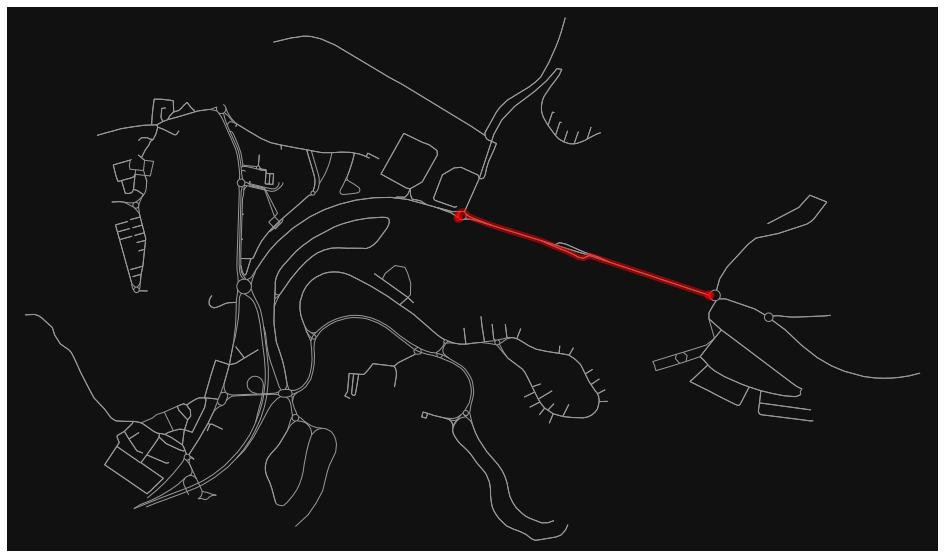

In [ ]:
# plot path
#G1 = ox.graph_from_address('Carretera Pamplona - Aoiz - Lumbier', network_type='drive')

#Aproximate origin and destination
#origin = (42.8252, -1.5611)
origin = (42.8252, -1.5614) #Y latitude and X longitude coordinates
#destination = (42.8287, -1.5739)
destination = (42.8285, -1.5739) #Y latitude and X longitude coordinates

#Nearest points within the fiber optic path
#origin_node = ox.get_nearest_node(G1, origin)
#destination_node = ox.get_nearest_node(G1, destination, method='euclidean')
#WARNING: The `get_nearest_node` function has been deprecated. Use the more efficient `distance.nearest_nodes` instead.
origin_node = ox.nearest_nodes(G1, origin[1], origin[0]) #G graph in which to find nearest nodes, X longitude, Y latitude coordinates
destination_node = ox.nearest_nodes(G1, destination[1],destination[0])  #G graph in which to find nearest nodes, X longitude, Y latitude coordinates

#Route from and to the origin_node to the destination_node
route = nx.shortest_path(G1, origin_node, destination_node)
#fig, ax = plt.subplots(figsize=(12,10))
fig, ax = ox.plot_graph_route(G1, route, route_color="r", route_linewidth=6, node_size=0, figsize=(18, 10))
plt.show()

##Medidas Junio Itaroa

MEDIDAS DAS

-Cada archivo de nombre "medida_2206dd_hh_mm_ss" se corresponde a una medida de 168 segundos, donde dd_hh_mm_ss indica el día (dd = 13 o 14) y la hora en la que se realizó el registro (el instante 0 segundos de la medida sería a la hora hh, en el minuto mm y en el segundo ss). La región de la carretera en la que se hicieron las medidas se corresponde con un tramo recto de 1.292 Km, situado en el Km 34 del trazado hacia Aoiz.

-Cada archivo contiene  

	- Fp ==> Matriz de valores de la medida DAS. Cada columna representa una traza a lo largo del tiempo obtenida para un valor de distancia concreto, y cada fila 	representa una traza a lo largo del eje distancia obtenida para un instante de tiempo concreto. 

	- muestreo_tiempo ==> Valor del periodo de muestro en el eje tiempo

	- muestreo_distancia ==> Valor del periodo de muestreo en el eje distancia

	- distancia ==> Vector con los valores en el eje distancia (desde 0 hasta 1292 metros)

	- tiempo ==> Vector con los valores en el eje tiempos (desde 0 hasta 168 segundos)

-Los archivos sin filtrar están nombrados como "medida_sin_filtrar_2206dd_hh_mm_ss", donde el filtro del que se ha prescindido es un filtro paso bajo de frecuencia de corte igual a 3.5 Hz.


VÍDEO 

-Cada archivo de nombre "video_2206dd_hh_mm_ss" se corresponde a una grabación de video de unos 180 segundos de duración (aunque puede variar), donde dd_hh_mm_ss indica el día y la hora en la que se inició la grabación del vídeo (el instante 0 segundos del vídeo sería a la hora hh, en el minuto mm y en el segundo ss). La cámara se ha situado en un lateral de la carretera a una cierta distancia de la misma. Como referencia se ha tomado el pivote de la foto adjunta (que en los vídeos, ese pivote es el situado en el lado de la carretera más cercano a la cámara), el cual se corresponde aproximadamente con la posición de la medida DAS 770 metros.


ASOCIACIÓN DAS - VÍDEO

-Hay un mapeo uno a uno entre los archivos de medida DAS y los archivos de vídeo. Para ver el tráfico asociado a una medida concreta, símplemente se escoge el vídeo cuyo nombre se corresponde con el nombre de la medida DAS. Aunque puede haber un pequeño lag entre ambos, en principio los tiempos dentro del vídeo y los de la medida DAS son coincidentes.


##Other

velocity range: [2,60]m/s

In [ ]:
print('2m/s = ',2*(1/1000)*3600, 'km/h')
print('2m/s = ',60*(1/1000)*3600, 'km/h')

2m/s =  7.2 km/h
2m/s =  216.0 km/h


#INPUT: Reading DAS data files

The original sensor data was provided as .mat files on a 20211130_Medidas folder, later incremented in ./DATOS_MEDIDAS/Medidas_Junio_Aoiz , Medidas_Junio_Itaroa , Medidas_Noviembre_Itaroa

##Matlab sensor files

Exploring the first files:
  - Fp : Data Array
  - distancia: distance of each measuring point from starting point (meters)
  - muestreo_distancia: distance between measuring points (meters)
  - muestreo_tiempo: time between measuring points (seconds)
  - tiempo: time when each measuring point was taken from starting point (seconds)

###Load data

In [ ]:
#variables from 'medida_211130_11_55_19.mat'
folder='./drive/MyDrive/INGESTION/20211130_Medidas'
filename='medida_211130_11_55_19.mat'
filedatetime = datetime(2021,11,30,11,55,19)
print(filedatetime)
#date1='2021-11-30'
#hour1='11:55:19'
date1=filedatetime.strftime("%Y-%m-%d")
hour1=filedatetime.strftime("%H:%M:%S")
print(date1)
print(hour1)

2021-11-30 11:55:19
2021-11-30
11:55:19


In [ ]:
#variables from 'medida_220613_15_42_42.mat'
folder='./drive/MyDrive/INGESTION/DATOS_MEDIDAS/Medidas_Junio_Aoiz'
filename='medida_220613_15_42_42.mat'
filedatetime = datetime(2022,6,13,15,42,42)
print(filedatetime)
#date1='2022-06-13'
#hour1='15:42:42'
date1=filedatetime.strftime("%Y-%m-%d")
hour1=filedatetime.strftime("%H:%M:%S")
print(date1)
print(hour1)
#Medidas Junio Aoiz 42.77378153586854, -1.4276218136848686
#    - Carretera Aoiz 42.77393578863405, -1.4275887153906144 km 34 de la NA-150. Avenida de Aoiz            (km16 para los cantabros)
#    - Los vídeos se sacan en perspectiva paralela a la carretera, no se sabe muy bien los metros hasta donde y desde donde abarcamos.
#    - La localización de la cámara se correspondería en la medida DAS con distancia = 770 metros, aproximadamente.


2022-06-13 15:42:42
2022-06-13
15:42:42


In [ ]:
#load matlab file
file=os.path.join(folder, filename)
#mat = scipy.io.loadmat(os.path.join(folder, filename))
mat = sio.loadmat(file)

In [ ]:
#load data into a dataframe
#First convert dictionary to series 
pqr=pd.Series(mat)
#then convert series into dataframe using pandas
matdf=pd.DataFrame({'label':pqr.index, 'list':pqr.values})
matdf

,label,list
0,__header__,"b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Crea..."
1,__version__,1.0
2,__globals__,[]
3,Fp,"[[0.0071577946509677704, 0.0077517555381831065..."
4,distancia,"[[1.0344827586231986, 2.068965517246397, 3.103..."
5,muestreo_distancia,[[1.0344827586231986]]
6,muestreo_tiempo,[[0.005200208008320333]]
7,tiempo,"[[0.005200208008320333, 0.010400416016640665, ..."


Separating dataframe into data structures:

In [ ]:
#Sensor data
Fp = pd.DataFrame(matdf["list"][3])
Fp

,0,1,2,3,4,5,6,7,8,9,...,1239,1240,1241,1242,1243,1244,1245,1246,1247,1248
0,0.007158,0.007752,0.003736,-0.000222,-0.008530,-0.009600,-0.009149,-0.009495,-0.008629,-0.005394,...,-0.008897,-0.020506,0.003396,0.021763,0.010167,-0.012207,0.042081,0.153216,0.223023,0.119396
1,0.007158,0.007781,0.003782,-0.000164,-0.008448,-0.009515,-0.009064,-0.009429,-0.008584,-0.005353,...,-0.008775,-0.020347,0.003544,0.021882,0.010328,-0.011977,0.042256,0.153242,0.222843,0.119390
2,0.007129,0.007813,0.003848,-0.000079,-0.008315,-0.009375,-0.008925,-0.009329,-0.008528,-0.005304,...,-0.008557,-0.020058,0.003808,0.022087,0.010611,-0.011560,0.042563,0.153251,0.222443,0.119332
3,0.007099,0.007871,0.003958,0.000063,-0.008101,-0.009153,-0.008702,-0.009163,-0.008426,-0.005215,...,-0.008229,-0.019621,0.004209,0.022403,0.011047,-0.010922,0.043038,0.153282,0.221864,0.119259
4,0.007156,0.008043,0.004197,0.000343,-0.007727,-0.008766,-0.008315,-0.008850,-0.008198,-0.005004,...,-0.007708,-0.018956,0.004828,0.022910,0.011713,-0.009986,0.043761,0.153420,0.221195,0.119250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32299,-0.011597,-0.012482,-0.010820,-0.009791,-0.003227,-0.002681,0.000158,-0.001804,-0.003707,-0.004355,...,-0.029453,-0.025002,-0.023400,-0.013990,-0.003472,-0.005868,-0.016469,-0.029468,-0.064043,-0.140431
32300,-0.011621,-0.012628,-0.011044,-0.010055,-0.003468,-0.002916,-0.000011,-0.001931,-0.003798,-0.004491,...,-0.029812,-0.025231,-0.023427,-0.013937,-0.003385,-0.005702,-0.016177,-0.029301,-0.064012,-0.140054
32301,-0.011696,-0.012798,-0.011274,-0.010317,-0.003712,-0.003156,-0.000199,-0.002088,-0.003926,-0.004653,...,-0.030137,-0.025458,-0.023501,-0.013952,-0.003373,-0.005631,-0.016011,-0.029231,-0.064046,-0.139826
32302,-0.011808,-0.012973,-0.011489,-0.010553,-0.003936,-0.003376,-0.000383,-0.002250,-0.004069,-0.004818,...,-0.030414,-0.025668,-0.023611,-0.014022,-0.003428,-0.005646,-0.015963,-0.029247,-0.064131,-0.139732


In [ ]:
#Distance intervals
distancia = pd.DataFrame(matdf["list"][4])
distancia

,0,1,2,3,4,5,6,7,8,9,...,1239,1240,1241,1242,1243,1244,1245,1246,1247,1248
0,1.034483,2.068966,3.103448,4.137931,5.172414,6.206897,7.241379,8.275862,9.310345,10.344828,...,1282.758621,1283.793103,1284.827586,1285.862069,1286.896552,1287.931034,1288.965517,1290.0,1291.034483,1292.068966


In [ ]:
#Distance sampling length
muestreo_distancia = matdf["list"][5][0][0]
muestreo_distancia

1.0344827586231986

In [ ]:
#Time sampling duration
muestreo_tiempo = matdf["list"][6][0][0]
muestreo_tiempo

0.005200208008320333

In [ ]:
#Time intervals
tiempo = pd.DataFrame(matdf["list"][7])
tiempo

,0,1,2,3,4,5,6,7,8,9,...,32294,32295,32296,32297,32298,32299,32300,32301,32302,32303
0,0.0052,0.0104,0.015601,0.020801,0.026001,0.031201,0.036401,0.041602,0.046802,0.052002,...,167.940718,167.945918,167.951118,167.956318,167.961518,167.966719,167.971919,167.977119,167.982319,167.98752


Rebuilding the dataframe with the appropiate cols and index (space and timestamp)

In [ ]:
#Add columns to create a standard TimeStamp index
#Fp.index #RangeIndex(start=0, stop=16000, step=1)
######## Add a column for the Timestamp (month, day, hour)
Fp['deltemp0'] = filedatetime
Fp['deltemp1']= (Fp.index+1)*muestreo_tiempo
Fp['deltemp2']=Fp.apply(lambda row: timedelta(seconds=row['deltemp1']), axis=1)
Fp['Timestamp']=Fp['deltemp0']+Fp['deltemp2']
Fp=Fp.drop(['deltemp0', 'deltemp1', 'deltemp2'], axis=1)# drop the auxiliary cols
Fp=Fp.set_index('Timestamp')
print('DATAFRAME SHAPE (TimeStamps , Position distances):',Fp.shape)

DATAFRAME SHAPE (TimeStamps , Position distances): (32304, 1249)


In [ ]:
#Add column names indicating the distance measured
#print(distancia.shape)
#print(type(distancia))
#print(distancia)
#https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.to_dict.html
#distancia.to_dict(orient='records') #[{0: 1.0344827586231986, 1: 2.068965517246397, 2: 3.103448275869596,...
Fp.rename(distancia.to_dict(orient='records')[0], axis=1, inplace=True) 

In [ ]:
#Check Fp sample duration
print("From : ",Fp.iloc[0].name)
print("To : ", Fp.iloc[-1].name)
Fpduration=Fp.iloc[-1].name-Fp.iloc[0].name
print("DAS measurements duration", Fpduration)
print("which corresponds with : ",Fpduration.seconds,"seconds")

From :  2022-06-13 15:42:42.005200
To :  2022-06-13 15:45:29.987520
DAS measurements duration 0 days 00:02:47.982320
which corresponds with :  167 seconds


NOTE: be carefull, the video might be of different time length (3min)

In [ ]:
######################################################
### Prepare the originals to be able to compare    ###
######################################################
Original = pd.DataFrame(matdf["list"][3])
print('Original ready, shape: ',Original.shape)
#Fp.columns#Float64Index([1.0344827586231986,  2.068965517246397,  3.103448275869596,...,1292.068965520375],dtype='float64', length=1249)
#print('col name :',Fp.loc[maskrows, maskcols][i].name)#750.000000001819
#print('col index:', Fp.columns.get_loc(750.000000001819))#724

Original ready, shape:  (32304, 1249)


In [ ]:
Fp

,1.034483,2.068966,3.103448,4.137931,5.172414,6.206897,7.241379,8.275862,9.310345,10.344828,...,1282.758621,1283.793103,1284.827586,1285.862069,1286.896552,1287.931034,1288.965517,1290.000000,1291.034483,1292.068966
Timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-13 15:42:42.005200,0.007158,0.007752,0.003736,-0.000222,-0.008530,-0.009600,-0.009149,-0.009495,-0.008629,-0.005394,...,-0.008897,-0.020506,0.003396,0.021763,0.010167,-0.012207,0.042081,0.153216,0.223023,0.119396
2022-06-13 15:42:42.010400,0.007158,0.007781,0.003782,-0.000164,-0.008448,-0.009515,-0.009064,-0.009429,-0.008584,-0.005353,...,-0.008775,-0.020347,0.003544,0.021882,0.010328,-0.011977,0.042256,0.153242,0.222843,0.119390
2022-06-13 15:42:42.015601,0.007129,0.007813,0.003848,-0.000079,-0.008315,-0.009375,-0.008925,-0.009329,-0.008528,-0.005304,...,-0.008557,-0.020058,0.003808,0.022087,0.010611,-0.011560,0.042563,0.153251,0.222443,0.119332
2022-06-13 15:42:42.020801,0.007099,0.007871,0.003958,0.000063,-0.008101,-0.009153,-0.008702,-0.009163,-0.008426,-0.005215,...,-0.008229,-0.019621,0.004209,0.022403,0.011047,-0.010922,0.043038,0.153282,0.221864,0.119259
2022-06-13 15:42:42.026001,0.007156,0.008043,0.004197,0.000343,-0.007727,-0.008766,-0.008315,-0.008850,-0.008198,-0.005004,...,-0.007708,-0.018956,0.004828,0.022910,0.011713,-0.009986,0.043761,0.153420,0.221195,0.119250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-13 15:45:29.966719,-0.011597,-0.012482,-0.010820,-0.009791,-0.003227,-0.002681,0.000158,-0.001804,-0.003707,-0.004355,...,-0.029453,-0.025002,-0.023400,-0.013990,-0.003472,-0.005868,-0.016469,-0.029468,-0.064043,-0.140431
2022-06-13 15:45:29.971919,-0.011621,-0.012628,-0.011044,-0.010055,-0.003468,-0.002916,-0.000011,-0.001931,-0.003798,-0.004491,...,-0.029812,-0.025231,-0.023427,-0.013937,-0.003385,-0.005702,-0.016177,-0.029301,-0.064012,-0.140054
2022-06-13 15:45:29.977119,-0.011696,-0.012798,-0.011274,-0.010317,-0.003712,-0.003156,-0.000199,-0.002088,-0.003926,-0.004653,...,-0.030137,-0.025458,-0.023501,-0.013952,-0.003373,-0.005631,-0.016011,-0.029231,-0.064046,-0.139826


### Load data without filter

In [ ]:
#variables from 'medida_no_filtrada_220613_15_42_42.mat'
folder='./drive/MyDrive/INGESTION/DATOS_MEDIDAS/Medidas_Junio_Aoiz'
filename='medida_no_filtrada_220613_15_42_42.mat'
filedatetime = datetime(2022,6,13,15,42,42)
date1=filedatetime.strftime("%Y-%m-%d")
hour1=filedatetime.strftime("%H:%M:%S")
#Medidas Junio Aoiz 42.77378153586854, -1.4276218136848686
#    - Carretera Aoiz 42.77393578863405, -1.4275887153906144 km 34 de la NA-150. Avenida de Aoiz            (km16 para los cantabros)
#    - Los vídeos se sacan en perspectiva paralela a la carretera, no se sabe muy bien los metros hasta donde y desde donde abarcamos.
#    - La localización de la cámara se correspondería en la medida DAS con distancia = 770 metros, aproximadamente.

In [ ]:
#load Not Filtered matlab file
file_nf=os.path.join(folder, filename)
#mat = scipy.io.loadmat(os.path.join(folder, filename))
mat_nf = sio.loadmat(file_nf)

In [ ]:
#load data into a dataframe
#First convert dictionary to series 
pqr_nf=pd.Series(mat_nf)
#then convert series into dataframe using pandas
matdf_nf=pd.DataFrame({'label':pqr_nf.index, 'list':pqr_nf.values})

In [ ]:
#Sensor data
Fp_nf = pd.DataFrame(matdf_nf["list"][3])
#Distance intervals
distancia = pd.DataFrame(matdf_nf["list"][4])
#Distance sampling length
muestreo_distancia = matdf_nf["list"][5][0][0]
#Time sampling duration
muestreo_tiempo = matdf_nf["list"][6][0][0]
#Time intervals
tiempo = pd.DataFrame(matdf_nf["list"][7])

In [ ]:
#Rebuilding the dataframe with the appropiate cols and index (space and timestamp)
#Add auxiliary columns to create a standard TimeStamp index
######## Add a column for the Timestamp (month, day, hour)
Fp_nf['deltemp0'] = filedatetime
Fp_nf['deltemp1']= (Fp_nf.index+1)*muestreo_tiempo
Fp_nf['deltemp2']=Fp_nf.apply(lambda row: timedelta(seconds=row['deltemp1']), axis=1)
Fp_nf['Timestamp']=Fp_nf['deltemp0']+Fp_nf['deltemp2']
Fp_nf=Fp_nf.drop(['deltemp0', 'deltemp1', 'deltemp2'], axis=1)# drop the auxiliary cols
#Setting new index
Fp_nf=Fp_nf.set_index('Timestamp')
#Add column names indicating the distance measured
Fp_nf.rename(distancia.to_dict(orient='records')[0], axis=1, inplace=True) 
print('DATAFRAME SHAPE (TimeStamps , Position distances):',Fp_nf.shape)

DATAFRAME SHAPE (TimeStamps , Position distances): (32304, 1249)


In [ ]:
######################################################
### Prepare the originals to be able to compare    ###
######################################################
Original_nf = pd.DataFrame(matdf_nf["list"][3]) #no filter
print('Original_nf ready, shape: ',Original.shape)
#Fp.columns#Float64Index([1.0344827586231986,  2.068965517246397,  3.103448275869596,...,1292.068965520375],dtype='float64', length=1249)
#print('col name :',Fp.loc[maskrows, maskcols][i].name)#750.000000001819
#print('col index:', Fp.columns.get_loc(750.000000001819))#724

Original_nf ready, shape:  (32304, 1249)


#ANALYSIS in time, space, dynamic, 3D

### Analysis of the measurements in time

In [ ]:
Fp

,1.034483,2.068966,3.103448,4.137931,5.172414,6.206897,7.241379,8.275862,9.310345,10.344828,...,1282.758621,1283.793103,1284.827586,1285.862069,1286.896552,1287.931034,1288.965517,1290.000000,1291.034483,1292.068966
Timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-13 15:42:42.005200,0.007158,0.007752,0.003736,-0.000222,-0.008530,-0.009600,-0.009149,-0.009495,-0.008629,-0.005394,...,-0.008897,-0.020506,0.003396,0.021763,0.010167,-0.012207,0.042081,0.153216,0.223023,0.119396
2022-06-13 15:42:42.010400,0.007158,0.007781,0.003782,-0.000164,-0.008448,-0.009515,-0.009064,-0.009429,-0.008584,-0.005353,...,-0.008775,-0.020347,0.003544,0.021882,0.010328,-0.011977,0.042256,0.153242,0.222843,0.119390
2022-06-13 15:42:42.015601,0.007129,0.007813,0.003848,-0.000079,-0.008315,-0.009375,-0.008925,-0.009329,-0.008528,-0.005304,...,-0.008557,-0.020058,0.003808,0.022087,0.010611,-0.011560,0.042563,0.153251,0.222443,0.119332
2022-06-13 15:42:42.020801,0.007099,0.007871,0.003958,0.000063,-0.008101,-0.009153,-0.008702,-0.009163,-0.008426,-0.005215,...,-0.008229,-0.019621,0.004209,0.022403,0.011047,-0.010922,0.043038,0.153282,0.221864,0.119259
2022-06-13 15:42:42.026001,0.007156,0.008043,0.004197,0.000343,-0.007727,-0.008766,-0.008315,-0.008850,-0.008198,-0.005004,...,-0.007708,-0.018956,0.004828,0.022910,0.011713,-0.009986,0.043761,0.153420,0.221195,0.119250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-13 15:45:29.966719,-0.011597,-0.012482,-0.010820,-0.009791,-0.003227,-0.002681,0.000158,-0.001804,-0.003707,-0.004355,...,-0.029453,-0.025002,-0.023400,-0.013990,-0.003472,-0.005868,-0.016469,-0.029468,-0.064043,-0.140431
2022-06-13 15:45:29.971919,-0.011621,-0.012628,-0.011044,-0.010055,-0.003468,-0.002916,-0.000011,-0.001931,-0.003798,-0.004491,...,-0.029812,-0.025231,-0.023427,-0.013937,-0.003385,-0.005702,-0.016177,-0.029301,-0.064012,-0.140054
2022-06-13 15:45:29.977119,-0.011696,-0.012798,-0.011274,-0.010317,-0.003712,-0.003156,-0.000199,-0.002088,-0.003926,-0.004653,...,-0.030137,-0.025458,-0.023501,-0.013952,-0.003373,-0.005631,-0.016011,-0.029231,-0.064046,-0.139826


In [ ]:
print("First TimeStamp: ",str(Fp.iloc[0].name))
print("Last  TimeStamp: ",str(Fp.iloc[-1].name))

First TimeStamp:  2022-06-13 15:42:42.005200
Last  TimeStamp:  2022-06-13 15:45:29.987520


In [ ]:
#Fp.plot(legend=False, figsize=(24,8))

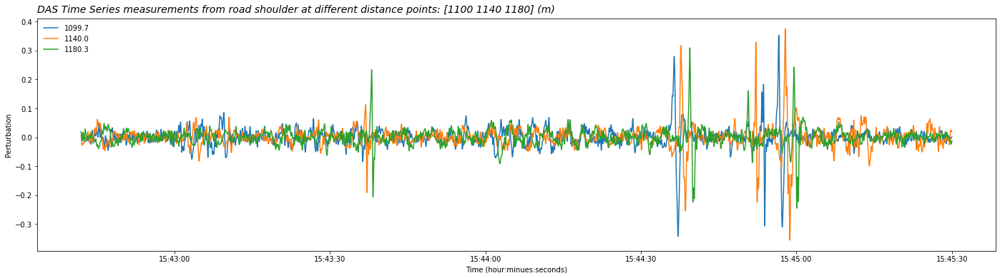

In [ ]:
#Example: Plot three different DAS measurements at different points (different samples of fiber sensing (aprox. 40m apart) to observe the difference in time)

#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#time_points = np.array(['2021-11-30 11:55:19.525221','2021-11-30 11:55:20.045242','2021-11-30 11:55:20.565263'], dtype='datetime64[ns]')
#g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
#maskcols = g()
#--- DISTANCE Data ---
#start_distance= 11.5
#end_distance=   16.5
#Adding a list of approximate points (in meters) to get the nearer columns
distance_points = np.array([1100,1140,1180],dtype='int64')#0-1200
#maskcols = (df.columns >= start_distance) & (df.columns <= end_distance)
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp.loc[:, maskcols].columns.values:
  ax.plot(Fp.loc[maskrows, maskcols][i],label=Fp.loc[maskrows, maskcols][i].name.round(1))#, linestyle='-', marker='.')
#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS Time Series measurements from road shoulder at different distance points: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

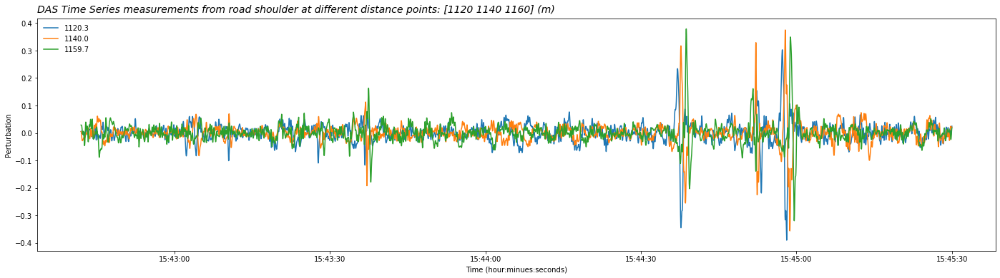

In [ ]:
#Example: Plot three different DAS measurements at different points (different samples of fiber sensing (aprox. 50m apart) to observe the difference in time)

#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#time_points = np.array(['2021-11-30 11:55:19.525221','2021-11-30 11:55:20.045242','2021-11-30 11:55:20.565263'], dtype='datetime64[ns]')
#g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
#maskcols = g()
#--- DISTANCE Data ---
#start_distance= 11.5
#end_distance=   16.5
#Adding a list of approximate points (in meters) to get the nearer columns
distance_points = np.array([1120,1140,1160],dtype='int64')#0-1200
#maskcols = (df.columns >= start_distance) & (df.columns <= end_distance)
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp.loc[:, maskcols].columns.values:
  ax.plot(Fp.loc[maskrows, maskcols][i],label=Fp.loc[maskrows, maskcols][i].name.round(1))#, linestyle='-', marker='.')
#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS Time Series measurements from road shoulder at different distance points: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

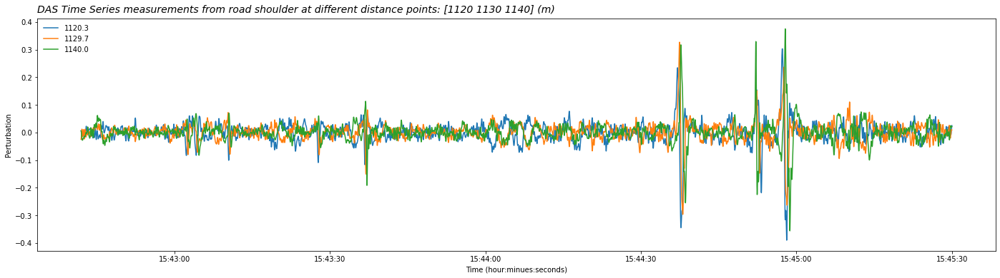

In [ ]:
#Example: Plot three different DAS measurements at different points (different samples of fiber sensing (aprox. 50m apart) to observe the difference in time)

#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#time_points = np.array(['2021-11-30 11:55:19.525221','2021-11-30 11:55:20.045242','2021-11-30 11:55:20.565263'], dtype='datetime64[ns]')
#g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
#maskcols = g()
#--- DISTANCE Data ---
#start_distance= 11.5
#end_distance=   16.5
#Adding a list of approximate points (in meters) to get the nearer columns
distance_points = np.array([1120,1130,1140],dtype='int64')#0-1200
#maskcols = (df.columns >= start_distance) & (df.columns <= end_distance)
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp.loc[:, maskcols].columns.values:
  ax.plot(Fp.loc[maskrows, maskcols][i],label=Fp.loc[maskrows, maskcols][i].name.round(1))#, linestyle='-', marker='.')
#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS Time Series measurements from road shoulder at different distance points: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

In [ ]:
#filename='medida_220613_15_42_42.mat': For this samples the videorecording readings show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#metro= 750

###Analysis of the measurements in space

In [ ]:
#Transpose: same but in space
Fp_T = Fp.T
Fp_T

Timestamp,2022-06-13 15:42:42.005200,2022-06-13 15:42:42.010400,2022-06-13 15:42:42.015601,2022-06-13 15:42:42.020801,2022-06-13 15:42:42.026001,2022-06-13 15:42:42.031201,2022-06-13 15:42:42.036401,2022-06-13 15:42:42.041602,2022-06-13 15:42:42.046802,2022-06-13 15:42:42.052002,...,2022-06-13 15:45:29.940718,2022-06-13 15:45:29.945918,2022-06-13 15:45:29.951118,2022-06-13 15:45:29.956318,2022-06-13 15:45:29.961518,2022-06-13 15:45:29.966719,2022-06-13 15:45:29.971919,2022-06-13 15:45:29.977119,2022-06-13 15:45:29.982319,2022-06-13 15:45:29.987520
1.034483,0.007158,0.007158,0.007129,0.007099,0.007156,0.007162,0.007023,0.006805,0.006868,0.006916,...,-0.010751,-0.010988,-0.011109,-0.011252,-0.011453,-0.011597,-0.011621,-0.011696,-0.011808,-0.011857
2.068966,0.007752,0.007781,0.007813,0.007871,0.008043,0.008191,0.008220,0.008192,0.008466,0.008740,...,-0.010653,-0.011129,-0.011471,-0.011814,-0.012189,-0.012482,-0.012628,-0.012798,-0.012973,-0.013053
3.103448,0.003736,0.003782,0.003848,0.003958,0.004197,0.004429,0.004556,0.004642,0.005046,0.005461,...,-0.008359,-0.008989,-0.009474,-0.009945,-0.010432,-0.010820,-0.011044,-0.011274,-0.011489,-0.011588
4.137931,-0.000222,-0.000164,-0.000079,0.000063,0.000343,0.000627,0.000816,0.000973,0.001457,0.001960,...,-0.006987,-0.007701,-0.008263,-0.008803,-0.009351,-0.009791,-0.010055,-0.010317,-0.010553,-0.010663
5.172414,-0.008530,-0.008448,-0.008315,-0.008101,-0.007727,-0.007326,-0.006998,-0.006682,-0.006017,-0.005315,...,-0.000635,-0.001293,-0.001806,-0.002305,-0.002817,-0.003227,-0.003468,-0.003712,-0.003936,-0.004040
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1287.931034,-0.012207,-0.011977,-0.011560,-0.010922,-0.009986,-0.008896,-0.007759,-0.006519,-0.004832,-0.003003,...,-0.006638,-0.006469,-0.006227,-0.006043,-0.005959,-0.005868,-0.005702,-0.005631,-0.005646,-0.005653
1288.965517,0.042081,0.042256,0.042563,0.043038,0.043761,0.044583,0.045403,0.046278,0.047555,0.048928,...,-0.018304,-0.017868,-0.017386,-0.016987,-0.016717,-0.016469,-0.016177,-0.016011,-0.015963,-0.015939
1290.000000,0.153216,0.153242,0.153251,0.153282,0.153420,0.153515,0.153475,0.153362,0.153527,0.153674,...,-0.030288,-0.030100,-0.029846,-0.029652,-0.029563,-0.029468,-0.029301,-0.029231,-0.029247,-0.029257
1291.034483,0.223023,0.222843,0.222443,0.221864,0.221195,0.220290,0.219061,0.217582,0.216205,0.214649,...,-0.063760,-0.063841,-0.063835,-0.063864,-0.063971,-0.064043,-0.064012,-0.064046,-0.064131,-0.064176


In [ ]:
#Fp_T.plot(legend=False, figsize=(24,8))

In [ ]:
print(Fp.iloc[23300,:].name)
print(Fp.iloc[23500,:].name)
print(Fp.iloc[23700,:].name)

2022-06-13 15:44:43.170047
2022-06-13 15:44:44.210088
2022-06-13 15:44:45.250130


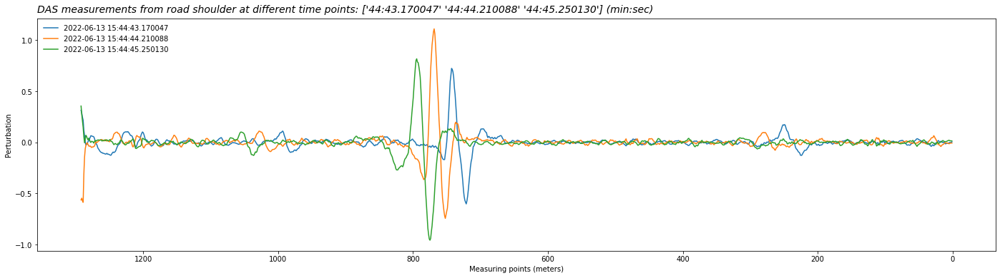

In [ ]:
#Example: Plot three different DAS measurements at different times

#--- TIME Data ---
#start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
#end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
#maskrows = (Fp_T.index >= start_date) & (Fp_T.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#np.arange(np.datetime64('2021-11-30 11:55:19.0'), np.datetime64('2021-11-30 11:55:20.0'))
time_points = np.array(['2022-06-13 15:44:43.170047',
                        '2022-06-13 15:44:44.210088',#equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m
                        '2022-06-13 15:44:45.250130'], dtype='datetime64[ns]')
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
#start_distance= 11.5
#end_distance=   16.5
#Adding a list of approximate points (in meters) to get the nearer columns
#distance_points = np.array([1036,1087,1138],dtype='int64')#0-1200
#maskcols = (df.columns >= start_distance) & (df.columns <= end_distance)
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp_T.loc[:, maskcols].columns.values:
  ax.plot(Fp_T.loc[:, maskcols][i],label=Fp_T.loc[:, maskcols][i].name)#, linestyle='-', marker='.')
#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
ax.invert_xaxis()
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

The example shown here corresponds with a heavy vehicle traveling away from Pamplona (to the left), that travels several hundred meters away from any other vehicle.

The time it takes different vehicles to travel the 1.292 Km of monitored fiber depends on the speed of the vehicles. In practice the average vehicle takes about a minute to cross the section.
<p>

| Speed (km/h)  |  Time(seg)   |
|------|:------|
|  130 | 0:36 | 
|  110 | 0:42 | 
|  90 | 0:52 | 
|  70 | 1:06 | 
|  50 | 1:33 | 
|  30 | 2:35 | 
|  10 | 7:45 | 

</p>


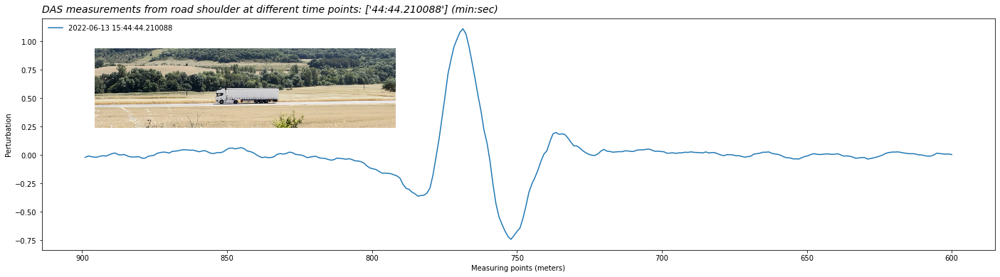

In [ ]:
#Example: Plot an example of a vehicle (direction away from Pamplona, further away from the fiber), heavvy vehicle
#--- TIME Data ---
#start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
#end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
#maskrows = (Fp_T.index >= start_date) & (Fp_T.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#np.arange(np.datetime64('2021-11-30 11:55:19.0'), np.datetime64('2021-11-30 11:55:20.0'))
#time_points = np.array(['2022-06-13 15:44:38.489860'], dtype='datetime64[ns]')
time_points = np.array(['2022-06-13 15:44:44.210088'], dtype='datetime64[ns]')#equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m

g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
start_distance= 600
end_distance=   900
#Adding a list of approximate points (in meters) to get the nearer columns
#distance_points = np.array([1036,1087,1138],dtype='int64')#0-1200
maskrows = (Fp_T.index >= start_distance) & (Fp_T.index <= end_distance)
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp_T.loc[maskrows, maskcols].columns.values:
  ax.plot(Fp_T.loc[maskrows, maskcols][i],label=Fp_T.loc[maskrows, maskcols][i].name)#, linestyle='-', marker='.')
#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
ax.invert_xaxis()
#--- IMAGE ---
filename='2022-06-13T15_44_44_Heavy_Truck.PNG'
auxfolder='./drive/MyDrive/INGESTION/Notebook_Auxfiles'
file=os.path.join(auxfolder, filename)
myimage = image.imread(file) #print(myimage.shape)
imagebox = OffsetImage(myimage, zoom = 0.38)
#ab = AnnotationBbox(imagebox, (50, 70))#, frameon = False)
ab = AnnotationBbox(imagebox, (0.45, 0.26), frameon = False)
ax1 = fig.add_axes([0.2, 0.6, 0.2, 0.2])
ax1.add_artist(ab)
ax1.axis('off')
#--- SHOW ---
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

In [ ]:
#Example of vehicle direction pamplona 15:45:08
print(Fp.iloc[27300,:].name)
print(Fp.iloc[27500,:].name)#video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
print(Fp.iloc[27700,:].name)
print(Fp.iloc[27900,:].name)

2022-06-13 15:45:03.970879
2022-06-13 15:45:05.010920
2022-06-13 15:45:06.050962
2022-06-13 15:45:07.091004


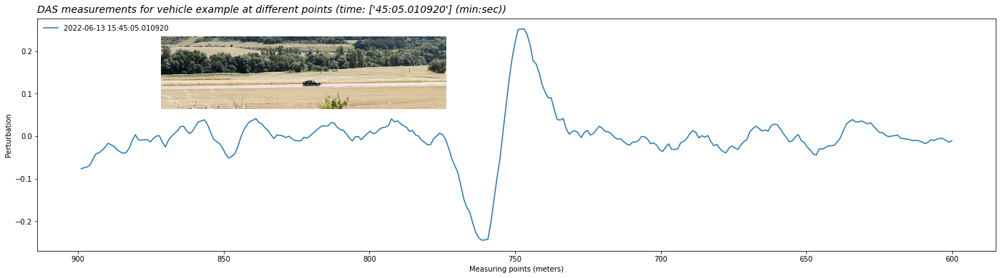

In [ ]:
#Example: Plot an example of a vehicle (direction Pamplona, near fiber)
#--- TIME Data ---
time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
start_distance= 600
end_distance=   900
maskrows = (Fp_T.index >= start_distance) & (Fp_T.index <= end_distance)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp_T.loc[maskrows, maskcols].columns.values:
  ax.plot(Fp_T.loc[maskrows, maskcols][i],label=Fp_T.loc[maskrows, maskcols][i].name)#, linestyle='-', marker='.')
ax.set_title(label="DAS measurements for vehicle example at different points (time: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec))",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
ax.invert_xaxis()
#--- IMAGE ---
filename='2022-06-13T15_45_08_Light_dir_right.PNG'
auxfolder='./drive/MyDrive/INGESTION/Notebook_Auxfiles'
file=os.path.join(auxfolder, filename)
myimage = image.imread(file) #print(myimage.shape)
imagebox = OffsetImage(myimage, zoom = 0.38)
#ab = AnnotationBbox(imagebox, (50, 70))#, frameon = False)
ab = AnnotationBbox(imagebox, (0.45, 0.26), frameon = False)
ax1 = fig.add_axes([0.25, 0.65, 0.2, 0.2])
ax1.add_artist(ab)
ax1.axis('off')
#--- SHOW ---
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()
#plt.clf()

In [ ]:
#filename='medida_220613_15_42_42.mat': For this samples the videorecording readings show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#metro= 750

In [ ]:
print(Fp.iloc[18500,:].name)
print(Fp.iloc[18600,:].name)
print(Fp.iloc[18700,:].name)
print(Fp.iloc[18800,:].name)
print(Fp.iloc[23500,:].name)
print(Fp.iloc[23700,:].name)
print(Fp.iloc[25500,:].name)
print(Fp.iloc[26000,:].name)
print(Fp.iloc[26500,:].name)
print(Fp.iloc[27000,:].name)
print(Fp.iloc[27500,:].name)#video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]

2022-06-13 15:44:18.209048
2022-06-13 15:44:18.729069
2022-06-13 15:44:19.249090
2022-06-13 15:44:19.769111
2022-06-13 15:44:44.210088
2022-06-13 15:44:45.250130
2022-06-13 15:44:54.610504
2022-06-13 15:44:57.210608
2022-06-13 15:44:59.810712
2022-06-13 15:45:02.410816
2022-06-13 15:45:05.010920


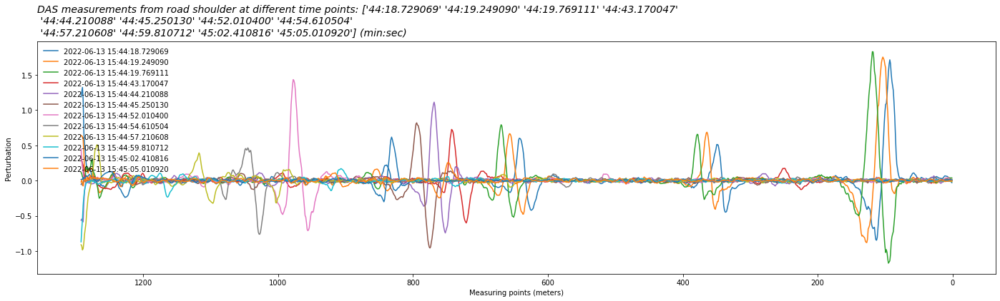

In [ ]:
#Example: Plot the DAS measurements of a truck at different times

#--- TIME Data ---
#start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
#end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
#maskrows = (Fp_T.index >= start_date) & (Fp_T.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#np.arange(np.datetime64('2021-11-30 11:55:19.0'), np.datetime64('2021-11-30 11:55:20.0'))
#'2022-06-13 15:45:05.010920': #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:44:18.729069',
                        '2022-06-13 15:44:19.249090',
                        '2022-06-13 15:44:19.769111',
                        '2022-06-13 15:44:43.170047',
                        '2022-06-13 15:44:44.210088',#equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m
                        '2022-06-13 15:44:45.250130',
                        '2022-06-13 15:44:52.010400',
                        '2022-06-13 15:44:54.610504',
                        '2022-06-13 15:44:57.210608',
                        '2022-06-13 15:44:59.810712',
                        '2022-06-13 15:45:02.410816',
                        '2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
#start_distance= 11.5
#end_distance=   16.5
#Adding a list of approximate points (in meters) to get the nearer columns
#distance_points = np.array([1036,1087,1138],dtype='int64')#0-1200
#maskcols = (df.columns >= start_distance) & (df.columns <= end_distance)
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp_T.loc[:, maskcols].columns.values:
  ax.plot(Fp_T.loc[:, maskcols][i],label=Fp_T.loc[:, maskcols][i].name)#, linestyle='-', marker='.')
#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
ax.invert_xaxis()
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

 - The graph shows the same heavy vehicle example as before (brown, purple, red) 
 - It seems that the initial meters of the fiber is not measuring correctly (since we can not detect the vehicle at the start 0m).
 - The initial readings of the example heavy vechicle [blue, orange:'2022-06-13 15:44:18.729069', '2022-06-13 15:44:19.249090',] are reversed if compared with the following ones [green: '2022-06-13 15:44:19.769111'], since they start high and continue low, instead of starting low and going high. It would appear as if the fiber measuring technique does not provide correct reading for the first 100 meters.
 - It seems that the last meters of the fiber are not measured correctly eather.

In [ ]:
print(Fp.iloc[18500,:].name)
print(Fp.iloc[18600,:].name)
print(Fp.iloc[18700,:].name)
print(Fp.iloc[18800,:].name)
print(Fp.iloc[18900,:].name)
print(Fp.iloc[19000,:].name)
print(Fp.iloc[19100,:].name)
print(Fp.iloc[19200,:].name)
print(Fp.iloc[19300,:].name)

2022-06-13 15:44:18.209048
2022-06-13 15:44:18.729069
2022-06-13 15:44:19.249090
2022-06-13 15:44:19.769111
2022-06-13 15:44:20.289132
2022-06-13 15:44:20.809152
2022-06-13 15:44:21.329173
2022-06-13 15:44:21.849194
2022-06-13 15:44:22.369215


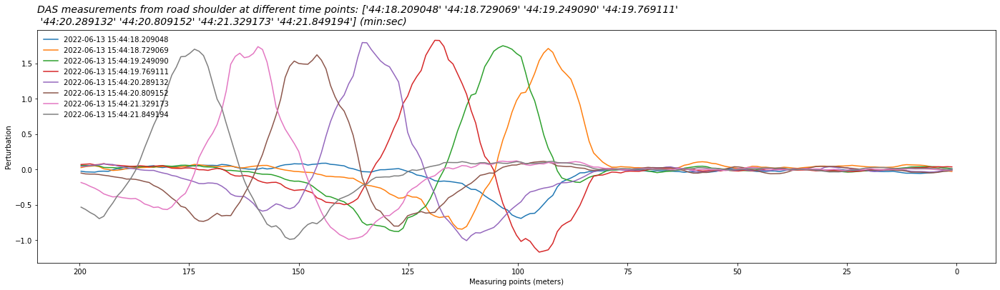

In [ ]:
#Example: Plot the intial meters

#--- TIME Data ---
#start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
#end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
#maskrows = (Fp_T.index >= start_date) & (Fp_T.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#np.arange(np.datetime64('2021-11-30 11:55:19.0'), np.datetime64('2021-11-30 11:55:20.0'))
time_points = np.array(['2022-06-13 15:44:18.209048',
                        '2022-06-13 15:44:18.729069',
                        '2022-06-13 15:44:19.249090',
                        '2022-06-13 15:44:19.769111',
                        '2022-06-13 15:44:20.289132',
                        '2022-06-13 15:44:20.809152',
                        '2022-06-13 15:44:21.329173',
                        '2022-06-13 15:44:21.849194'], dtype='datetime64[ns]')
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
start_distance= 0
end_distance=   200
#Adding a list of approximate points (in meters) to get the nearer columns
#distance_points = np.array([1036,1087,1138],dtype='int64')#0-1200
maskrows = (Fp_T.index >= start_distance) & (Fp_T.index <= end_distance)
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp_T.loc[:, maskcols].columns.values:
  ax.plot(Fp_T.loc[maskrows, maskcols][i],label=Fp_T.loc[maskrows, maskcols][i].name)#, linestyle='-', marker='.')
#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
ax.invert_xaxis()
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

The initial 80 meters are not measured correctly

In [ ]:
print('\'',Fp.iloc[25000,:].name,'\',', sep='')
print('\'',Fp.iloc[25500,:].name,'\',', sep='')
print('\'',Fp.iloc[26000,:].name,'\',', sep='')
print('\'',Fp.iloc[26500,:].name,'\',', sep='')
print('\'',Fp.iloc[27000,:].name,'\',', sep='')
print('\'',Fp.iloc[27500,:].name,'\',', sep='')
print('\'',Fp.iloc[28000,:].name,'\'', sep='')

'2022-06-13 15:44:52.010400',
'2022-06-13 15:44:54.610504',
'2022-06-13 15:44:57.210608',
'2022-06-13 15:44:59.810712',
'2022-06-13 15:45:02.410816',
'2022-06-13 15:45:05.010920',
'2022-06-13 15:45:07.611024'


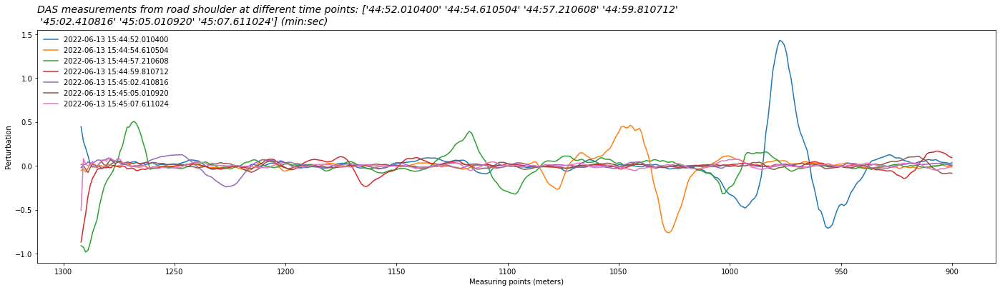

In [ ]:
#Example: Plot the last meters

#--- TIME Data ---
#start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
#end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
#maskrows = (Fp_T.index >= start_date) & (Fp_T.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#np.arange(np.datetime64('2021-11-30 11:55:19.0'), np.datetime64('2021-11-30 11:55:20.0'))
time_points = np.array(['2022-06-13 15:44:52.010400',
                        '2022-06-13 15:44:54.610504',
                        '2022-06-13 15:44:57.210608',
                        '2022-06-13 15:44:59.810712',
                        '2022-06-13 15:45:02.410816',
                        '2022-06-13 15:45:05.010920',
                        '2022-06-13 15:45:07.611024'], dtype='datetime64[ns]')
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
start_distance= 900
end_distance=   1292.068966
#Adding a list of approximate points (in meters) to get the nearer columns
#distance_points = np.array([1036,1087,1138],dtype='int64')#0-1200
maskrows = (Fp_T.index >= start_distance) & (Fp_T.index <= end_distance)
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp_T.loc[:, maskcols].columns.values:
  ax.plot(Fp_T.loc[maskrows, maskcols][i],label=Fp_T.loc[maskrows, maskcols][i].name)#, linestyle='-', marker='.')
#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
ax.invert_xaxis()
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

From the existing 1292.068966m, the last 298 meters are not measured correctly (asuming correct measurements from 80 to 1000m)

Therefore for the DAS measurements of the medida_220613_15_42_42.mat file we should consider only from 80m to 1000m to have clean measurements.

### Dynamic analysis

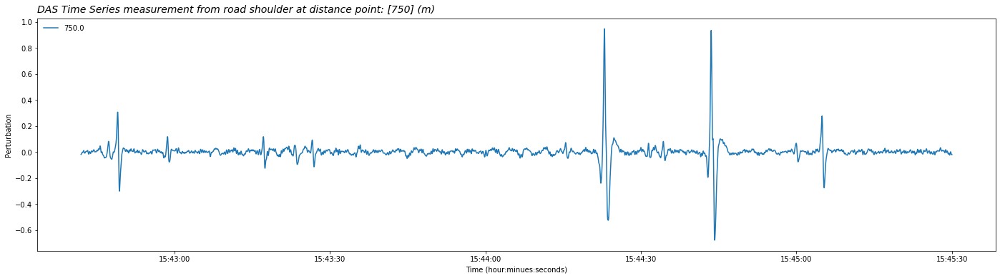

In [ ]:
#Example: Plot one DAS measurements at all times

#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#time_points = np.array(['2022-06-13 15:44:38.489860','2022-06-13 15:44:39.529901','2022-06-13 15:44:40.569943'], dtype='datetime64[ns]')
#g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
#maskcols = g()
#--- DISTANCE Data ---
#start_distance= 11.5
#end_distance=   16.5
#Adding a list of approximate points (in meters) to get the nearer columns
distance_points = np.array([750],dtype='int64')#0-1200
#maskcols = (df.columns >= start_distance) & (df.columns <= end_distance)
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp.loc[:, maskcols].columns.values:
  ax.plot(Fp.loc[maskrows, maskcols][i],label=Fp.loc[maskrows, maskcols][i].name.round(1))#, linestyle='-', marker='.')
#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS Time Series measurement from road shoulder at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

In [ ]:
#filename='medida_211130_11_55_19.mat': For this samples the videorecording readings show 13 vehicles traveling towards Pamplona (\) and 6 in the opposite direction (/).
#The patters of the 19 vehicles are: 
#                \  \   \  \  \  /          /            /      \(h)  /     \                                   /  \ \                           \  \               \ /     \

In [ ]:
#filename='medida_220613_15_42_42.mat': For this samples the videorecording readings show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#metro= 750

In [ ]:
#Fp_T.columns[0].value #1638273319005200000
#Fp_T.columns[0]       #Timestamp('2021-11-30 11:55:19.005200')
#str(Fp_T.columns[0])  #2021-11-30 11:55:19.005200
print(str(Fp_T.columns[0]) )
#Fp_T['2021-11-30 11:55:19.005200']
Fp_T[str(Fp_T.columns[1])]
#'2021-11-30 11:55:19.005200', '2021-11-30 11:55:19.010400','2021-11-30 11:55:19.015601', '2021-11-30 11:55:19.020801','2021-11-30 11:55:19.026001', '2021-11-30 11:55:19.031201',

2022-06-13 15:42:42.005200


1.034483       0.007158
2.068966       0.007781
3.103448       0.003782
4.137931      -0.000164
5.172414      -0.008448
                 ...   
1287.931034   -0.011977
1288.965517    0.042256
1290.000000    0.153242
1291.034483    0.222843
1292.068966    0.119390
Name: 2022-06-13 15:42:42.010400, Length: 1249, dtype: float64

In [ ]:
#import matplotlib.animation
import matplotlib.animation as animation# plot a figure of a specific size
from matplotlib import rc
rc('animation', html='jshtml')
%matplotlib inline

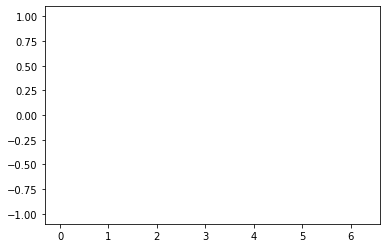

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "html5"
import matplotlib.animation
import numpy as np

t = np.linspace(0,2*np.pi)#array([0. , 0.12822827, 0.25645654,..., 6.15495704, 6.28318531])
x = np.sin(t)#array([ 0.00000000e+00, 1.27877162e-01,...,-1.27877162e-01, -2.44929360e-16])

fig, ax = plt.subplots()
l, = ax.plot([0,2*np.pi],[-1,1])#(0, 6.283185307179586)

animate = lambda i: l.set_data(t[:i], x[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(t))
ani

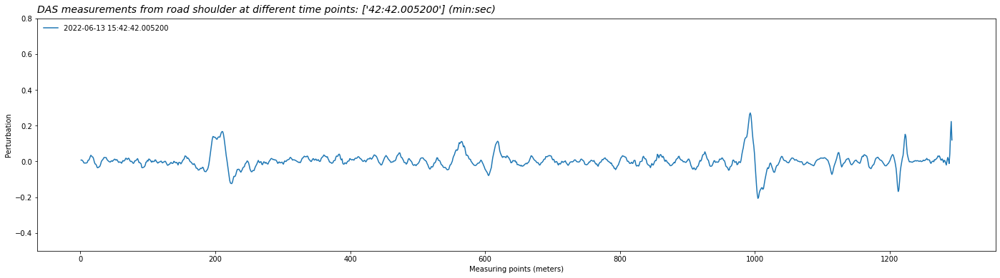

In [ ]:
####################################################################
######  PLOT ANIMATION
######  
####################################################################
import matplotlib.animation as animation# plot a figure of a specific size
#Transpose: same but in space
#Fp_T = Fp.T

fig, ax = plt.subplots(1,1,figsize=(24,6))# function to plot the chart
def animate(ii):
   #ii=0    ->array(['2022-06-13T15:42:42.005200000'], dtype='datetime64[ns]')
   #ii=2000 ->array(['2022-06-13T15:42:52.405616000'], dtype='datetime64[ns]')
   time_points = np.array([str(Fp_T.columns[ii])], dtype='datetime64[ns]')
   g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
   maskcols = g()
   #print(ii)
   #--- PLOT ---
   ax.clear()# clear the chart and plot again
   #ax.contourf(Fp_T[:, maskcols])
   for i in Fp_T.loc[:, maskcols].columns.values:
     ax.plot(Fp_T.loc[:, maskcols][i],label=Fp_T.loc[:, maskcols][i].name)#, linestyle='-', marker='.')
   ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
                fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
                color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
   ax.legend(loc='upper left', frameon=False)
   ax.set(xlabel="Measuring points (meters)",
          ylabel="Perturbation")#,
   ax.set_ylim([-0.5, 0.8])
ani = animation.FuncAnimation(fig, animate, 2000,interval=20)#interval: Delay between frames in milliseconds.
#ani = animation.FuncAnimation(fig, animate, 5, interval=50, blit=False)
ani
#plt.show()

In [ ]:
np.array([str(Fp_T.columns[3000])], dtype='datetime64[ns]')

array(['2022-06-13T15:42:57.605824000'], dtype='datetime64[ns]')

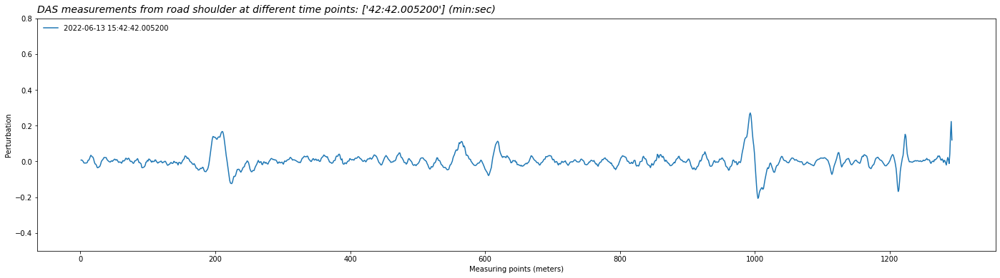

In [ ]:
####################################################################
######  PLOT ANIMATION 2
######  
####################################################################
#import matplotlib.animation as animation# plot a figure of a specific size
#Transpose: same but in space
Fp_T = Fp.T

fig, ax = plt.subplots(1,1,figsize=(24,6))# function to plot the chart
def animate2(ii):
   time_points = np.array([str(Fp_T.columns[ii])], dtype='datetime64[ns]')
   #ii=0    ->array(['2022-06-13T15:42:42.005200000'], dtype='datetime64[ns]')
   #ii=2000 ->array(['2022-06-13T15:42:52.405616000'], dtype='datetime64[ns]')
   #ii=3000 ->array(['2022-06-13T15:42:57.605824000'], dtype='datetime64[ns]')
   g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
   maskcols = g()
   #print(ii)
   #--- PLOT ---
   ax.clear()# clear the chart and plot again
   for i in Fp_T.loc[:, maskcols].columns.values:
     ax.plot(Fp_T.loc[:, maskcols][i],label=Fp_T.loc[:, maskcols][i].name)#, linestyle='-', marker='.')
   ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
                fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
                color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
   ax.legend(loc='upper left', frameon=False)
   ax.set(xlabel="Measuring points (meters)",
          ylabel="Perturbation")#,
   ax.set_ylim([-0.5, 0.8])
#ani2 = animation.FuncAnimation(fig, animate2, 2000,interval=40)#interval: Delay between frames in milliseconds. 1/(40/1000)=25 frames/seg
#WARNING:matplotlib.animation:Animation size has reached 21009324 bytes, exceeding the limit of 20971520.0
ani2 = animation.FuncAnimation(fig, animate2, 2000,interval=50)#1/(20/1000) = 50
#ani = animation.FuncAnimation(fig, animate, 5, interval=50, blit=False)
ani2
#plt.show()

In [ ]:
1/(20/1000)

50.0

###3D

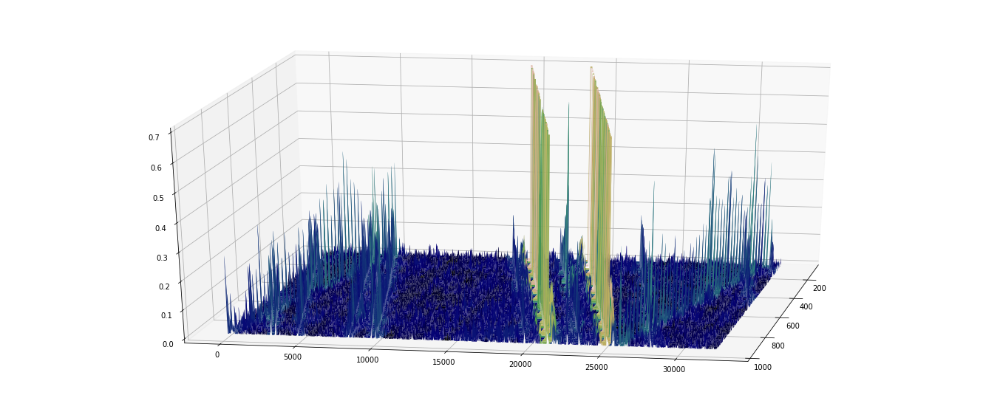

In [ ]:
#################################################################
#### 3D graph plot_surface   (clipping)                       ###
#################################################################
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
#distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)

data = Original.loc[maskrows, maskcols]
#data = Original.loc[maskrows, :]

x = data.columns
y = data.index
X,Y = np.meshgrid(x,y)
#Z = data
#Z = data.clip(-0.1, 1.3)
Z = data.clip(-0, 0.7)

fig = plt.figure(figsize=(24,10))
ax = fig.add_subplot(111, projection='3d')
#ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
#ax.plot_surface(X, Y, abs(Z), cmap='hot')#'prism')#'gist_earth')#'Greens')
#ax.plot_surface(X, Y, abs(Z), cmap='tab20')
#ax.plot_surface(X, Y, abs(Z), cmap='gist_ncar')
#ax.plot_surface(X, Y, abs(Z), cmap='flag')
#ax.plot_surface(X, Y, abs(Z), cmap='terrain')
ax.plot_surface(X, Y, Z, cmap='gist_earth')

ax.view_init(23, 10)
#ax.plot_surface(X,Y,Z, alpha = 0.5, color = 'red')
#ax.view_init(120, 30)# graph with an elevated angle of 120 degrees and a horizontal angle of 30 degrees.
#ax.view_init(-140, 60)#graph with an elevated angle of -140 degrees and a horizontal angle of 60 degrees.
#ax.colorbar()
#plt.colorbar(img, ax=ax)
plt.show()

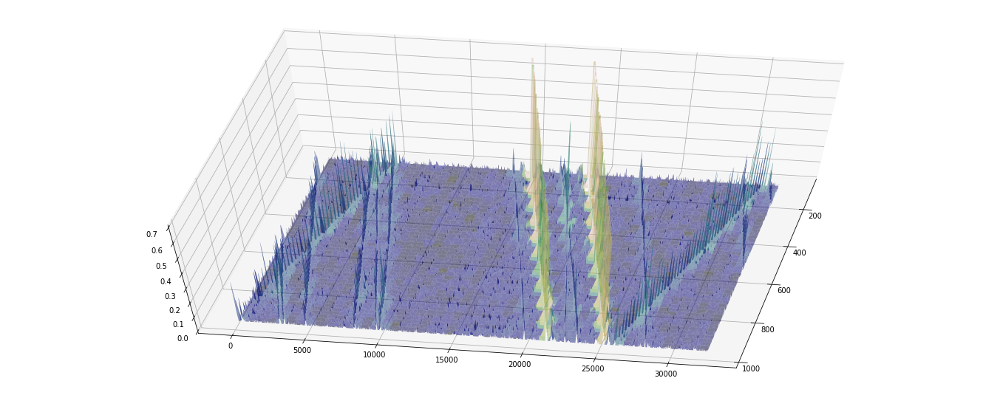

In [ ]:
#################################################################
#### 3D graph plot_surface   (clipping, another angle)        ###
#################################################################
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
#distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)

data = Original.loc[maskrows, maskcols]
#data = Original.loc[maskrows, :]

x = data.columns
y = data.index
X,Y = np.meshgrid(x,y)
#Z = data
#Z = data.clip(-0.1, 1.3)
Z = data.clip(-0, 0.7)

fig = plt.figure(figsize=(24,10))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='gist_earth', alpha = 0.5)

ax.view_init(60, 10)
#ax.plot_surface(X,Y,Z, alpha = 0.5, color = 'red')
#ax.view_init(120, 30)# graph with an elevated angle of 120 degrees and a horizontal angle of 30 degrees.
#ax.view_init(-140, 60)#graph with an elevated angle of -140 degrees and a horizontal angle of 60 degrees.
plt.show()

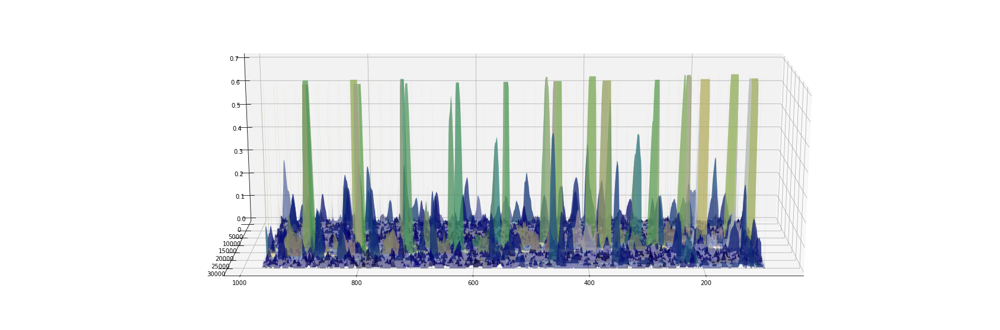

In [ ]:
#################################################################
#### 3D graph plot_surface   (clipping, another angle)        ###
#################################################################
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
#distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)

data = Original.loc[maskrows, maskcols]
#data = Original.loc[maskrows, :]

x = data.columns
y = data.index
X,Y = np.meshgrid(x,y)
#Z = data
#Z = data.clip(-0.1, 1.3)
Z = data.clip(-0, 0.7)

fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='gist_earth', alpha = 0.5)

ax.view_init(15, 90)
#ax.plot_surface(X,Y,Z, alpha = 0.5, color = 'red')
#ax.view_init(120, 30)# graph with an elevated angle of 120 degrees and a horizontal angle of 30 degrees.
#ax.view_init(-140, 60)#graph with an elevated angle of -140 degrees and a horizontal angle of 60 degrees.
plt.show()

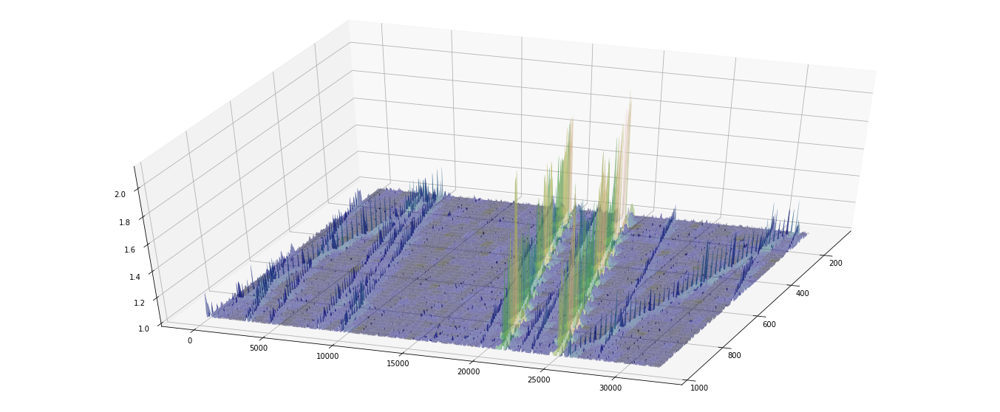

In [ ]:
#################################################################
#### 3D graph plot_surface   (logarithm)                      ###
#################################################################
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
#distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)

data = Original.loc[maskrows, maskcols]
#data = Original.loc[maskrows, :]

x = data.columns
y = data.index
X,Y = np.meshgrid(x,y)
#Z = data
#Z = data.clip(-0.1, 1.3)
Z = np.log2(data.clip(0, 10)+2)

fig = plt.figure(figsize=(24,10))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='gist_earth', alpha = 0.5)

ax.view_init(45, 20)
#ax.plot_surface(X,Y,Z, alpha = 0.5, color = 'red')
#ax.view_init(120, 30)# graph with an elevated angle of 120 degrees and a horizontal angle of 30 degrees.
#ax.view_init(-140, 60)#graph with an elevated angle of -140 degrees and a horizontal angle of 60 degrees.
plt.show()

In [ ]:
#################################################################
#### 3D graph plot_surface   (median())                      ###
#################################################################
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
#distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)

data = Original.loc[maskrows, maskcols]
#data = Original.loc[maskrows, :]

x = data.columns
y = data.index
X,Y = np.meshgrid(x,y)
#Z = data
#Z = data.clip(-0.1, 1.3)
#Z = np.log2(data.clip(0, 10)+2)
#Z = data.rolling(window=30).median() 
Z = (data.clip(0, 1.9)+0).rolling(window=1).median() 

fig = plt.figure(figsize=(24,10))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='gist_earth', alpha = 0.5)

ax.view_init(45, 20)
#ax.plot_surface(X,Y,Z, alpha = 0.5, color = 'red')
#ax.view_init(120, 30)# graph with an elevated angle of 120 degrees and a horizontal angle of 30 degrees.
#ax.view_init(-140, 60)#graph with an elevated angle of -140 degrees and a horizontal angle of 60 degrees.
plt.show()


In [ ]:
Z

In [ ]:
df[(df < threshold)]

In [ ]:
#################################################################
#### 3D graph plot_surface   (median())                      ###
#################################################################
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
#distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)

data = Original.loc[maskrows, maskcols]
#data = Original.loc[maskrows, :]

x = data.columns
y = data.index
X,Y = np.meshgrid(x,y)
#Z = data
#Z = data.clip(-0.1, 1.3)
#Z = np.log2(data.clip(0, 10)+2)
#Z = data.rolling(window=30).median() 
#Z = (data.clip(0, 1.9)+0).rolling(window=1).median() 
# Clip the data
df = (data.clip(0, 1.9)+0)
# Calculate the rolling mean of the dataframe 
df_mean = df.rolling(window=3).mean() 
# Calculate the rolling standard deviation of the dataframe 
df_std = df.rolling(window=3).std() 
# Calculate a threshold based on the rolling mean and standard deviation 
threshold = df_mean + (2 * df_std) 
# Create a new dataframe with the filtered values 
Z_withNan = df[(df < threshold)]#.all(axis=1)] #along the columns
Z = Z_withNan.fillna(0)#fill Nan with 0s
# Output the filtered dataframe
#Z.to_csv('filtered_dataframe.csv', index=False)

fig = plt.figure(figsize=(24,10))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='gist_earth', alpha = 0.6)

ax.view_init(45, 20)
#ax.plot_surface(X,Y,Z, alpha = 0.5, color = 'red')
#ax.view_init(120, 30)# graph with an elevated angle of 120 degrees and a horizontal angle of 30 degrees.
#ax.view_init(-140, 60)#graph with an elevated angle of -140 degrees and a horizontal angle of 60 degrees.
plt.show()


In [ ]:
#################################################################
#### 3D graph plot_surface   (median())                      ###
#################################################################
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
#distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)

#data = Original.loc[maskrows, maskcols]
data = Fp.loc[maskrows, maskcols]
#change the columns to int (mm)
data_columns1=data.columns*1000
data_columns2=data_columns1.fillna(0.0).astype(int)
data.columns = data_columns2

#Z = data
#Z = data.clip(-0.1, 1.3)
#Z = np.log2(data.clip(0, 10)+2)
#Z = data.rolling(window=30).median() 
#Z = (data.clip(0, 1.9)+0).rolling(window=1).median() 
# Clip the data
df = (data.clip(0, 1.9)+0)
# Calculate the rolling mean of the dataframe 
df_mean = df.rolling(window='1s').mean() 
# Calculate the rolling standard deviation of the dataframe 
df_std = df.rolling(window='1s').std() 
# Calculate a threshold based on the rolling mean and standard deviation 
threshold = df_mean + (2 * df_std) 
# Create a new dataframe with the filtered values 
Z_withNan = df[(df < threshold)]#.all(axis=1)] #along the columns
Z = Z_withNan.fillna(0)#fill Nan with 0s
Z= Z.reset_index().drop(columns=['Timestamp'])
# Output the filtered dataframe
#Z.to_csv('filtered_dataframe.csv', index=False)
x = Z.columns
y = Z.index
X,Y = np.meshgrid(x,y)

fig = plt.figure(figsize=(24,10))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='gist_earth', alpha = 0.5)

ax.view_init(45, 20)
#ax.plot_surface(X,Y,Z, alpha = 0.5, color = 'red')
#ax.view_init(120, 30)# graph with an elevated angle of 120 degrees and a horizontal angle of 30 degrees.
#ax.view_init(-140, 60)#graph with an elevated angle of -140 degrees and a horizontal angle of 60 degrees.
plt.show()

#ANALYSIS: Peak analysis
<h3 id="Peak analysis">Peak Analysis</h3>

In [ ]:
####################################################################
######  Example: FIND SIGNAL PEAKS for a given distance in Fp
######  Fp, 1000m
####################################################################
#Source:https://blog.ytotech.com/2015/11/01/findpeaks-in-python/
#https://peakutils.readthedocs.io/en/latest/
#Selecting an approximate point (in meters) to get the nearer column
distance_points = np.array([1000],dtype='int64')#from 0-1200
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()

cb = Fp.loc[:, maskcols].values #numpy.ndarray
#print('max',max(cb),' min',min(cb))
#indexes = peakutils.indexes(cb, thres=0.02/max(cb), min_sample_dist=5)
#print("Our original Array Dimensions...",cb.ndim)
#print("Our reduced Array Dimensions...",np.add.reduce(cb, axis = 1).ndim)
indexes = peakutils.indexes(np.add.reduce(cb, axis = 1), thres=0.05/max(cb), min_dist=10)
print('Number of peaks: ',len(indexes))
#indexes

Number of peaks:  815


threshold:  [0.21423727]  Min. Number of samples between peaks:  200 Number of peaks:  14


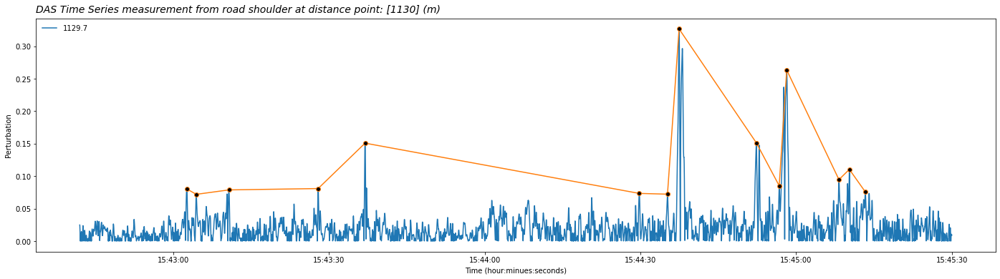

In [ ]:
####################################################################
######  Example: PLOT SIGNAL EXAMPLE AND PEAKS
######  Fp, 1130m
####################################################################
#Source:https://blog.ytotech.com/2015/11/01/findpeaks-in-python/
#https://peakutils.readthedocs.io/en/latest/

#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#time_points = np.array(['2022-06-13 15:44:38.489860','2022-06-13 15:44:39.529901','2022-06-13 15:44:40.569943'], dtype='datetime64[ns]')
#g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
#maskcols = g()
#--- DISTANCE Data ---
#start_distance= 11.5
#end_distance=   16.5
#Adding a list of approximate points (in meters) to get the nearer columns
distance_points = np.array([1130],dtype='int64')#0-1200
#maskcols = (df.columns >= start_distance) & (df.columns <= end_distance)
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()

data3 = Fp.loc[maskrows, maskcols].abs().values #numpy.ndarray
#indexes = peakutils.indexes(data3, thres=2.5/max(data3), min_sample_dist=2000)
thres=0.07/max(data3)
min_sample_dist=200 #min number of samples between peaks
indexes = peakutils.indexes(np.add.reduce(data3, axis = 1), thres, min_sample_dist)
print('threshold: ',thres,' Min. Number of samples between peaks: ',min_sample_dist, 'Number of peaks: ',len(indexes))

#--- PLOT ---
#fig, ax1 =plt.subplots(nrows=1,ncols=1,figsize=(28, 6), dpi= 100, facecolor='w', edgecolor='k')
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp.loc[:, maskcols].columns.values:
  ax.plot(Fp.loc[maskrows, maskcols][i].abs(),label=Fp.loc[maskrows, maskcols][i].name.round(1))#, linestyle='-', marker='.')
ax.plot(Fp.iloc[indexes,maskcols].abs(),linestyle='-',marker='o', markerfacecolor='black')

#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS Time Series measurement from road shoulder at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

In [ ]:
#filename='medida_211130_11_55_19.mat': For this samples the videorecording readings show 13 vehicles traveling towards Pamplona (\) and 6 in the opposite direction (/).
#The patters of the 19 vehicles are: 
#                \  \   \  \  \  /          /            /      \(h)  /     \                                   /  \ \                           \  \               \ /     \

In [ ]:
####################################################################
######  FUNCTION: delay_between_consecutives
######  find TIME GAPS (in seconds) between consecutive perturbances
######  in order to ease finding the corresponding video inputs
####################################################################
def delay_between_consecutives(indexes):
    #Return list of delays between consecutive indexes
    a = 1
    result = []
    for v in indexes:
        if a == len(indexes):
            break
        else:
            result.append(float((indexes[a]-v)*muestreo_tiempo))
            #print(indexes[a],-v,(indexes[a]-v)*muestreo_tiempo, )
            a=a+1
    return result
print(delay_between_consecutives(indexes)) #in seconds
#rounded = [float(np.round(x)) for x in delay_between_consecutives(indexes)]
#print(rounded) #in seconds

[1.8304732189287571, 6.281851274050962, 17.19188767550702, 9.043161726469059, 52.81851274050962, 5.429017160686428, 2.236089443577743, 14.872594903796152, 4.409776391055642, 1.4508580343213728, 10.057202288091524, 2.0072802912116483, 3.078523140925637]


Next we will need to calculate the Peak Timestamps Matrix (for each distance within Fp) to allow further comparisons with the timestamp from the videos. [PENDING]

In [ ]:
#Peak timestamps (Seconds) from the begining of the video
indexes*muestreo_tiempo

array([ 20.61362454,  22.44409776,  28.72594904,  45.91783671,
        54.96099844, 107.77951118, 113.20852834, 115.44461778,
       130.31721269, 134.72698908, 136.17784711, 146.2350494 ,
       148.24232969, 151.32085283])

In [ ]:
####################################################################
######  CALCULATE Peak timestamps Matrix (Fp_Peaks) 
######  in order to ease finding the corresponding video inputs
####################################################################
Fp_Peaks = pd.DataFrame().reindex_like(Fp)
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])

#--- DISTANCE Data ---
#distance_points = np.array([1000],dtype='int64')#0-1200
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()

#--- PEAK Data ---
thres=0.07/max(Fp)
#min_sample_dist: #min number of samples between peaks 
# parámetro relacionado con la minima distancia intervehículos (asuminedo vehículos consecutivos, no los que se cruzan)
# por ejemplo: 200*muestreo_tiempo=1.0400416016640666 segundos, que 
# a 100km/h son 28.890044490668515 m y 
# a 50km/h son 14.445022245334258 m de distancia intervehículo
min_sample_dist=250
seg=min_sample_dist*muestreo_tiempo
vel=50#km/h
dist=1000*vel*seg/60/60
print('For min_sample_dist=',min_sample_dist,
      '(samples), the road distance between consecutive vehicles at vel:',vel,'(km/h), would be :',round(1000*vel*seg/60/60,2), 
      '(meters), while at vel:',2*vel ,'(km/h) it would be :',round(1000*2*vel*seg/60/60,2),'(meters)')

#--- CALCULATE Peak timestamps Matrix ---
for column in Fp:
    #print('Column Name : ', column)
    distance_points = np.array([column],dtype='int64')#from 0-1200
    g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
    maskcols = g()
    cb = Fp.loc[:, maskcols].values #numpy.ndarray
    #thres=0.07/max(Fp[column])
    #print('threshold: ',thres)
    indexes = peakutils.indexes(np.add.reduce(cb, axis = 1), thres, min_sample_dist)
    for i in indexes:
      #Fp_Peaks[column][i]=1
      Fp_Peaks[column][i]=column
    #print(indexes)
print('Done: Fp_Peaks ', Fp_Peaks.shape)
print('Peak Threshold: ',thres,' Min. Number of samples between peaks: ',min_sample_dist)#, 'Number of peaks: ',len(indexes))

For min_sample_dist= 250 (samples), the road distance between consecutive vehicles at vel: 50 (km/h), would be : 18.06 (meters), while at vel: 100 (km/h) it would be : 36.11 (meters)
Done: Fp_Peaks  (32304, 1249)
Peak Threshold:  5.4176674672940404e-05  Min. Number of samples between peaks:  250


In [ ]:
#ERROR PLOT FAILED
#plt.pcolor(Fp)#Tu sesión ha fallado porque se ha usado toda la memoria RAM disponible. Si te interesa disfrutar de tiempos de ejecución con más memoria RAM, echa un vistazo a Colab Pro.

In [ ]:
#CHECK DATAFRAME SIZE
print(Fp_Peaks.size, Fp_Peaks.shape, Fp_Peaks.ndim)#18560000 (16000, 1160) 2
row, col = Fp_Peaks.shape
print(col) #print(Fp.shape[1])

40347696 (32304, 1249) 2
1249


In [ ]:
#ERROR Tu sesión ha fallado porque se ha usado toda la memoria RAM disponible. Si te interesa disfrutar de tiempos de ejecución con más memoria RAM, echa un vistazo a Colab Pro.

filename='medida_211130_11_55_19.mat': For this samples the videorecording readings show 13 vehicles traveling towards Pamplona (\) and 6 in the opposite direction (/).


In [ ]:
#The patters from filename='medida_211130_11_55_19.mat' are:
#                \  \   \  \  \  /          /            /      \(h)  /     \                                   /  \ \                           \  \               \ /     \

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

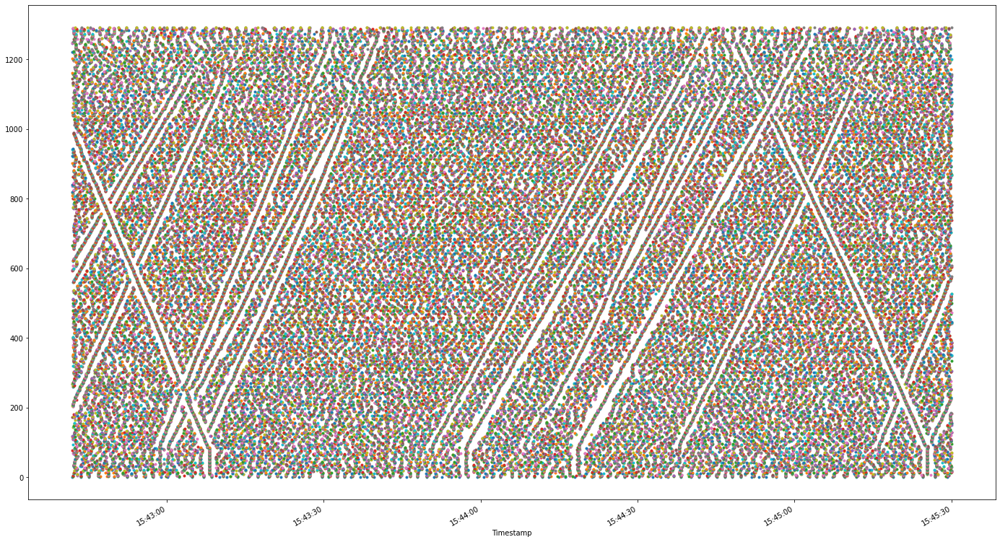

In [ ]:
####################################################################
######  PLOT PSEUDO-pcolor GRAPH showing trajectories
######  from Fp_Peaks
####################################################################
Fp_Peaks.plot(legend=False, linestyle='-',marker='.',figsize=(24,14))

### SAVE OUTPUT FILE LOCALLY
from google.colab import files
Outputfilename='PLOT PSEUDO-pcolor GRAPH showing trajectories.png'
plt.savefig(Outputfilename)
#with open('example.txt', 'w') as f:
#  f.write('some content')
files.download(Outputfilename)

### OPEN LOCAL FILE
#from google.colab import files
#uploaded = files.upload()
#for fn in uploaded.keys():
#  print('User uploaded file "{name}" with length {length} bytes'.format(
#      name=fn, length=len(uploaded[fn])))

Would it be similar with the Traspose?

In [ ]:
Fp_T

threshold:  [0.0662245]  Min. Number of samples between peaks:  45 Number of peaks:  8


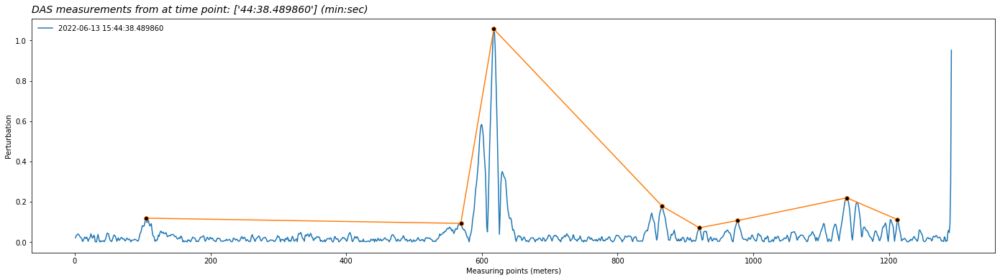

In [ ]:
####################################################################
######  Example : PLOT SIGNAL EXAMPLE AND PEAKS from transpose
######  Fp_T, at '2022-06-13 15:44:38.489860'
####################################################################
#--- TIME Data ---
time_points = np.array(['2022-06-13 15:44:38.489860'], dtype='datetime64[ns]')
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
#all
#--- PEAKS ---
data3 = Fp_T.loc[:, maskcols].abs().values #numpy.ndarray
#indexes = peakutils.indexes(data3, thres=2.5/max(data3), min_sample_dist=2000)
thres=0.07/max(data3)
min_sample_dist=45 #min number of samples between peaks
indexes = peakutils.indexes(np.add.reduce(data3, axis = 1), thres, min_sample_dist)
print('threshold: ',thres,' Min. Number of samples between peaks: ',min_sample_dist, 'Number of peaks: ',len(indexes))

#--- PLOT ---
#fig, ax1 =plt.subplots(nrows=1,ncols=1,figsize=(28, 6), dpi= 100, facecolor='w', edgecolor='k')
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp_T.loc[:, maskcols].columns.values:
  ax.plot(Fp_T.loc[:, maskcols][i].abs(),label=Fp_T.loc[:, maskcols][i].name)#, linestyle='-', marker='.')
  #ax.plot(Fp_T.loc[:, maskcols][i],label=Fp_T.loc[:, maskcols][i].name)#, linestyle='-', marker='.')
ax.plot(Fp_T.iloc[indexes,maskcols].abs(),linestyle='-',marker='o', markerfacecolor='black')

#print(pd.to_datetime(str(time_points[0])).strftime('%Y-%m-%dT%H:%M:%S.%f')) #2021-11-30T11:55:19.525221
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(time_points)+" (sec)",
ax.set_title(label="DAS measurements from at time point: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
#plt.savefig("DAS measurement at a TimeStamp "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)
plt.show()

In [ ]:
data3 = Fp_T.loc[:, :].abs().values #numpy.ndarray
#indexes = peakutils.indexes(data3, thres=2.5/max(data3), min_sample_dist=2000)
thres=0.07/data3.max()
print(data3.max())
print(thres)

3.218997893585266
0.021745898044697128


The Peak threshold and min_sample are different

In [ ]:
####################################################################
######  CALCULATE Peak timestamps Matrix (Fp_T_Peaks) 
######  in order to ease finding the corresponding video inputs
######  Warning : slow (several miuntes)
####################################################################
Fp_T_Peaks = pd.DataFrame().reindex_like(Fp_T)
data3 = Fp_T.loc[:, :].abs().values #numpy.ndarray
#--- PEAK Data ---
thres=0.07/data3.max()#thres=0.07/max(Fp)
min_sample_dist=45

for column in Fp_T:
    time_points = np.array([column], dtype='datetime64[ns]')
    g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
    maskcols = g()
    cb = Fp_T.loc[:, maskcols].values #numpy.ndarray
    indexes = peakutils.indexes(np.add.reduce(cb, axis = 1), thres, min_sample_dist)
    for i in indexes:
      myvalue=Fp_T_Peaks.iloc[i].name #using the distance as value
      mycolindex=Fp_T_Peaks.columns.get_loc(column)
      #Fp_T_Peaks.loc[:,column].iloc[i]=myvalue #ok, but slow
      Fp_T_Peaks.iloc[i,mycolindex]=myvalue
print('Done: Fp_T_Peaks', Fp_T_Peaks.shape)
print('Peak threshold: ',thres,' Min. Number of samples between peaks: ',min_sample_dist)#, 'Number of peaks: ',len(indexes))

Done: Fp_T_Peaks (1249, 32304)
Peak threshold:  0.021745898044697128  Min. Number of samples between peaks:  45


In [ ]:
#Change back the Transposed form
Fp_T_Peaks = Fp_T_Peaks.T
Fp_T_Peaks

,1.034483,2.068966,3.103448,4.137931,5.172414,6.206897,7.241379,8.275862,9.310345,10.344828,...,1282.758621,1283.793103,1284.827586,1285.862069,1286.896552,1287.931034,1288.965517,1290.000000,1291.034483,1292.068966
Timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-13 15:42:42.005200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1291.034483,NaN
2022-06-13 15:42:42.010400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1291.034483,NaN
2022-06-13 15:42:42.015601,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1291.034483,NaN
2022-06-13 15:42:42.020801,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1291.034483,NaN
2022-06-13 15:42:42.026001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1291.034483,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-13 15:45:29.966719,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-06-13 15:45:29.971919,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-06-13 15:45:29.977119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Add a row of 0´s to avoid misploting dates
Fp_T_Peaks.loc['2022-06-13 15:42:42.005200',:] = 0

In [ ]:
Fp_T_Peaks

In [ ]:
'''
#Multiply corresponding cells of Fp_Peaks with the ones of Fp_T_Peaks
#(As a combnation of both peak analysis)
print("Fp_Peaks   ", Fp_Peaks.shape)  #Fp_Peaks    (32304, 1249)
print("Fp_T_Peaks ", Fp_T_Peaks.shape)#Fp_T_Peaks  (1249, 32304)
Fp_T_Peaks_T = Fp_T_Peaks.T
print("Fp_T_Peaks_T ", Fp_T_Peaks_T.shape)#Fp_T_Peaks  (1249, 32304)
#Fp_Peaks_multiplied = [[Fp_Peaks.iloc[i,j] * Fp_T_Peaks_T.iloc[i,j]  for j in range (len(Fp_Peaks.iloc[0]))] for i in range(len(Fp_Peaks))] #warning 30 min long
arr = Fp_Peaks.to_numpy()
arr1 = Fp_T_Peaks_T.to_numpy()
arr2 = np.multiply(arr, arr1)
print("Fp_Peaks_multiplied ", np.shape(arr2))#Fp_T_Peaks  (1249, 32304)
Fp_Peaks_multiplied = pd.DataFrame(arr2)#, columns = ['Column_A','Column_B','Column_C'], index = ['Item_1', 'Item_2'])
Fp_Peaks_multiplied = pd.DataFrame().reindex_like(Fp_Peaks)
Fp_Peaks_multiplied.head()

#result not positive (no coincidences on the multiplication)
'''

In [ ]:
def print_full(x):
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 2000)
    pd.set_option('display.float_format', '{:20,.2f}'.format)
    pd.set_option('display.max_colwidth', None)
    print(x)
    pd.reset_option('display.max_rows')
    pd.reset_option('display.max_columns')
    pd.reset_option('display.width')
    pd.reset_option('display.float_format')
    pd.reset_option('display.max_colwidth')

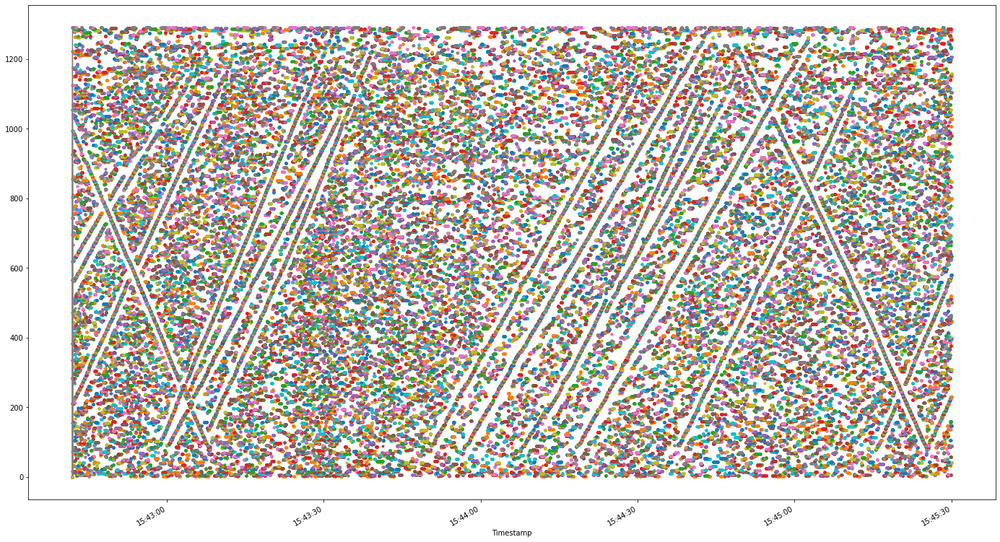

In [ ]:
####################################################################
######  PLOT PSEUDO-pcolor GRAPH showing trajectories
######  from Fp_T_Peaks
####################################################################
Fp_T_Peaks.plot(legend=False, linestyle='-',marker='.',figsize=(24,14))

In [ ]:
#Find exact time stamp
Fp_T_Peaks.iloc[26580,:].name

Timestamp('2022-06-13 15:45:00.226729')

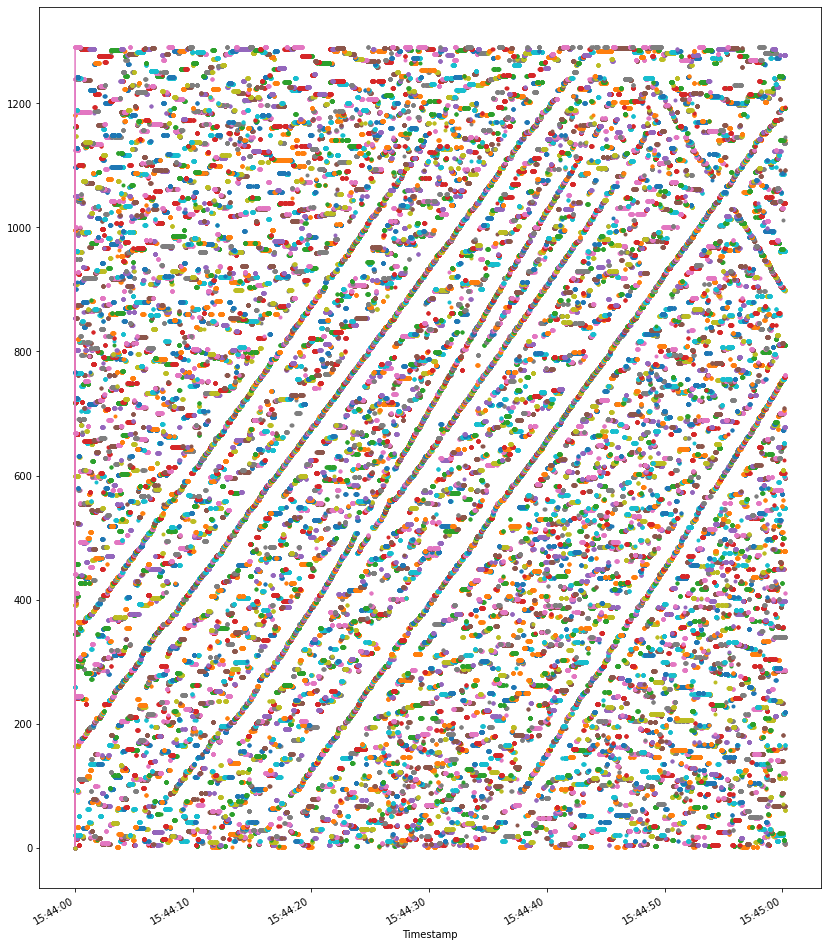

In [ ]:
####################################################################
######  PLOT PSEUDO-pcolor GRAPH showing trajectories
######  from Fp_T_Peaks interval '2022-06-13 15:44:00.008320' to '2022-06-13 15:45:00.226729'
####################################################################
#Fp_T_Peaks_T.loc['2022-06-13 15:42:42.005200':'2022-06-13 15:42:42.026001'].plot(legend=False, linestyle='-',marker='.',figsize=(24,14))
data4 = Fp_T_Peaks.loc['2022-06-13 15:44:00.008320':'2022-06-13 15:45:00.226729'].copy()
#Add a row of 0´s to avoid misploting dates
data4.iloc[0,:] = 0
data4.plot(legend=False, linestyle='-',marker='.',figsize=(14,18))

In [ ]:
Fp_T_Peaks.loc['2022-06-13 15:44:00.008320':'2022-06-13 15:45:00.226729',1290.0000000031287]

In [ ]:
pd.plotting.table(ax,Fp_T_Peaks.loc['2022-06-13 15:44:00.008320':'2022-06-13 15:45:00.226729',1290.0000000031287])

#ANALYSIS: WAVELETS

$\mathbf{\text{Wavelet}}$<br>
***
1.&emsp;Waveform of limited duration, that has an average value of zero 
$$\psi_{a,b}(t) = \frac{1}{\sqrt{a}} \psi\Bigg(\frac{t-b}{a}\Bigg)\space\space a,b \in \mathbb{R} $$
 - a : scale parameter or dilation, which in our case could be as large as 100m based on the largest truck effects detected by DAS.
 - b : position parameter or translation

***
$\mathbf{\text{Discrete Wavelet Transform (DWT)}}$<br>
***
Two ways:

1.&emsp;Redundant Wavelet Transform (Frames) <br>

&emsp;&emsp; - a (Dilation): powers of a fixed parameter $a=(a_{0})^{m}$ where $a_{0}$ is >1, and $m$ correspond to wavelets of different widths.<br>
 &emsp;&emsp; - b (Scale): discretized as: $b=nb_{0}(a_{0})^m$, where $b_{0}>0$ is fixed and $n\in \mathbb{Z} (integers)$<br>
 
 &emsp;&emsp; - Wavelet:
 $$\psi_{m,n}(k) = a_{0}^{-\frac{m}{2}} \psi(a_{0}^{-m}(k-nb_{0}a_{0}^m))\space\space m,n \in \mathbb{Z} $$<br>

  &emsp;&emsp; - Discrete Wavelet Transform for a function f(k):<br>
  $$DWT(m,n) = \langle f, \psi_{m,n} \rangle=(a_{0})^{-\frac{m}{2}} \sum \limits _{k=-\infty } ^{\infty } f(k)·\psi^{*}(a_{0}^{-m}k-nb_{0})$$<br>


2.&emsp;Multiresolution Analysis (MRA) <br>

&emsp;&emsp; - Having Dyadic scales and positions (values based on powers of two), such as : $a_{0}=2$ (Dilation), and $b_{0}=1$(Scale), then:
 
 &emsp;&emsp; - Wavelet:
 $$\psi_{m,n}(k) = 2^{-\frac{m}{2}} \psi(2^{-m}k-n)\space\space m,n \in \mathbb{Z} $$<br>

  &emsp;&emsp; - Discrete Wavelet Transform for a function f(k):<br>
  $$DWT(m,n) = \langle f, \psi_{m,n} \rangle=2^{-\frac{m}{2}} \sum \limits _{k=-\infty } ^{\infty } f(k)·\psi^{*}(2^{-m}k-n)$$<br>

***

There are many kind of wavelet types, whoever one that is quite similar to the perturbance detected by DAS caused by the traffic is the Daubechies Wavelet (Db).

To check existing wavelets we can use the browser: http://wavelets.pybytes.com/

/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  if len(wiskhi) == 0 or np.max(wiskhi) < q3:


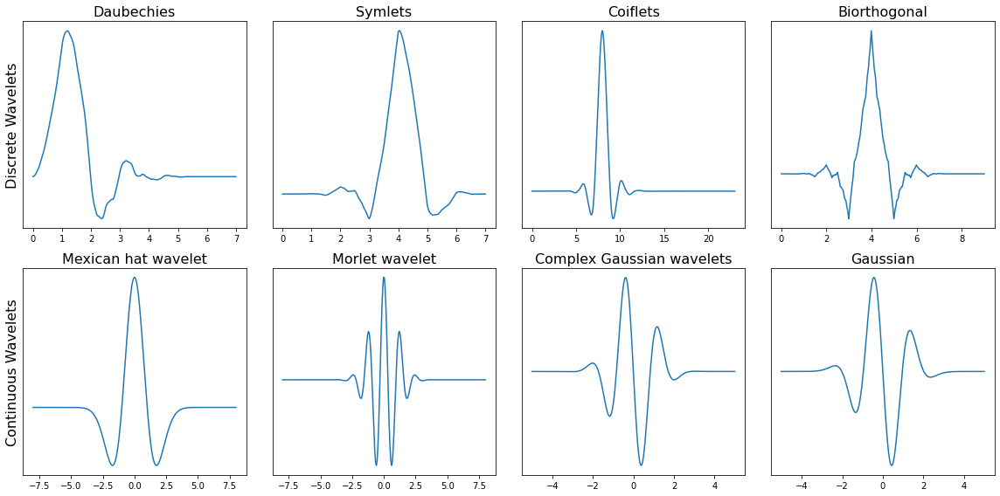

In [ ]:
#plot with several different families of wavelets.	
discrete_wavelets = ['db4', 'sym4', 'coif4', 'bior2.4']
continuous_wavelets = ['mexh', 'morl', 'cgau5', 'gaus5']
 
list_list_wavelets = [discrete_wavelets, continuous_wavelets]
list_funcs = [pywt.Wavelet, pywt.ContinuousWavelet]
 
fig, axarr = plt.subplots(nrows=2, ncols=4, figsize=(16,8))
for ii, list_wavelets in enumerate(list_list_wavelets):
    func = list_funcs[ii]
    row_no = ii
    for col_no, waveletname in enumerate(list_wavelets):
        wavelet = func(waveletname)
        family_name = wavelet.family_name
        biorthogonal = wavelet.biorthogonal
        orthogonal = wavelet.orthogonal
        symmetry = wavelet.symmetry
        if ii == 0:
            _ = wavelet.wavefun()
            wavelet_function = _[0]
            x_values = _[-1]
        else:
            wavelet_function, x_values = wavelet.wavefun()
        if col_no == 0 and ii == 0:
            axarr[row_no, col_no].set_ylabel("Discrete Wavelets", fontsize=16)
        if col_no == 0 and ii == 1:
            axarr[row_no, col_no].set_ylabel("Continuous Wavelets", fontsize=16)
        axarr[row_no, col_no].set_title("{}".format(family_name), fontsize=16)
        axarr[row_no, col_no].plot(x_values, wavelet_function)
        axarr[row_no, col_no].set_yticks([])
        axarr[row_no, col_no].set_yticklabels([])
 
plt.tight_layout()
plt.show()

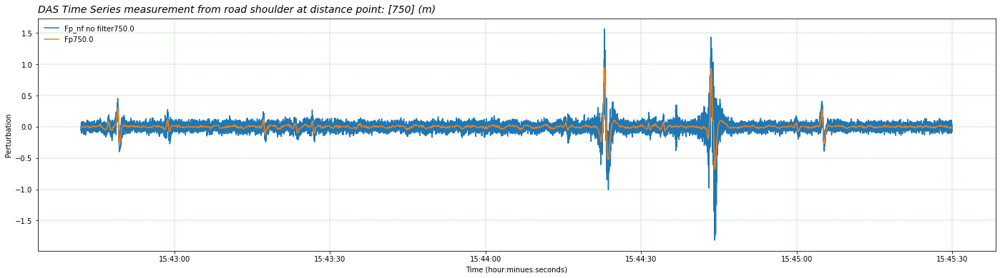

In [ ]:
#Reference Plot example of one DAS measurement from meter 750m at all times
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp.loc[:, maskcols].columns.values:
  ax.plot(Fp_nf.loc[maskrows, maskcols][i],label='Fp_nf no filter'+str(Fp.loc[maskrows, maskcols][i].name.round(1)))#, linestyle='-', marker='.')
  ax.plot(Fp.loc[maskrows, maskcols][i],label='Fp'+str(Fp.loc[maskrows, maskcols][i].name.round(1)))#, linestyle='-', marker='.')
  
ax.set_title(label="DAS Time Series measurement from road shoulder at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
#example DAS signal (750m)
Fp.loc[maskrows, maskcols].values

array([[-0.01919651],
       [-0.01914153],
       [-0.01906373],
       ...,
       [-0.0208567 ],
       [-0.02090405],
       [-0.0209172 ]])

In [ ]:
#Discrete Wavelet Transform (dwt)
#cA:Aproximation coef. , cD:Detail coef.
cA, cD = pywt.dwt(Fp.loc[maskrows, maskcols].values, 'db4')

#Inverse  Wavelet Transform (idwt)
y=pywt.idwt(cA,cD,'db4')

print('Approximation coefficients: ',cA, cA.shape)
print('Detail coefficients: ',cD, cD.shape)
print('Inverse  Wavelet Transform (idwt)',y, y.shape)

Approximation coefficients:  [[-0.02714797 -0.02714797 -0.02714797 -0.02714797]
 [-0.02707022 -0.02707022 -0.02707022 -0.02707022]
 [-0.02696019 -0.02696019 -0.02696019 -0.02696019]
 ...
 [-0.02949583 -0.02949583 -0.02949583 -0.02949583]
 [-0.02956279 -0.02956279 -0.02956279 -0.02956279]
 [-0.02958138 -0.02958138 -0.02958138 -0.02958138]] (32304, 4)
Detail coefficients:  [[-8.67361738e-19 -8.67361738e-19 -4.33680869e-19 -9.75781955e-19]
 [ 1.49077799e-18  6.23416249e-19  1.89735380e-19  6.23416249e-19]
 [-4.60785923e-19  4.06575815e-19  1.27393755e-18  7.31836466e-19]
 ...
 [-1.08420217e-19 -1.08420217e-19 -1.08420217e-19 -8.67361738e-19]
 [ 8.40256684e-19  8.40256684e-19  4.06575815e-19  1.38235777e-18]
 [-1.16551734e-18 -2.98155597e-19  5.69206141e-19 -8.40256684e-19]] (32304, 4)
Inverse  Wavelet Transform (idwt) [[-0.01919651 -0.01919651]
 [-0.01914153 -0.01914153]
 [-0.01906373 -0.01906373]
 ...
 [-0.0208567  -0.0208567 ]
 [-0.02090405 -0.02090405]
 [-0.0209172  -0.0209172 ]] (3230

In [ ]:
#Approximation coefficients description
df_describe = pd.DataFrame(cA)
print(df_describe.shape)
df_describe.describe()

(32304, 4)


,0,1,2,3
count,32304.000000,32304.000000,32304.000000,32304.000000
mean,0.000245,0.000245,0.000245,0.000245
std,0.103064,0.103064,0.103064,0.103064
min,-0.960781,-0.960781,-0.960781,-0.960781
25%,-0.015166,-0.015166,-0.015166,-0.015166
50%,0.002023,0.002023,0.002023,0.002023
75%,0.016472,0.016472,0.016472,0.016472
max,1.338912,1.338912,1.338912,1.338912


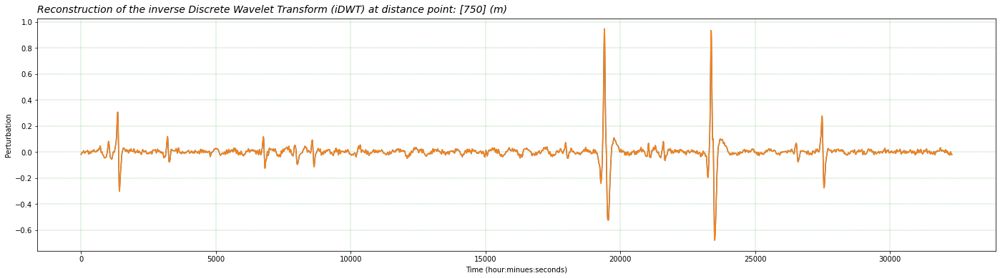

In [ ]:
#Example: PLOT y, Reconstruction of the idwt
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
ax.plot(y)#, linestyle='-', marker='.')
#for i in Fp.loc[:, maskcols].columns.values:
#  ax.plot(Fp.loc[maskrows, maskcols][i],label='Fp'+str(Fp.loc[maskrows, maskcols][i].name.round(1)))#, linestyle='-', marker='.')
ax.set_title(label="Reconstruction of the inverse Discrete Wavelet Transform (iDWT) at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
#UNDERSTANDING THE 750m signal from filename='medida_220613_15_42_42.mat': 
#For this samples the videorecording readings show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#metro= 750

In [ ]:
cA

array([[-0.02714797, -0.02714797, -0.02714797, -0.02714797],
       [-0.02707022, -0.02707022, -0.02707022, -0.02707022],
       [-0.02696019, -0.02696019, -0.02696019, -0.02696019],
       ...,
       [-0.02949583, -0.02949583, -0.02949583, -0.02949583],
       [-0.02956279, -0.02956279, -0.02956279, -0.02956279],
       [-0.02958138, -0.02958138, -0.02958138, -0.02958138]])

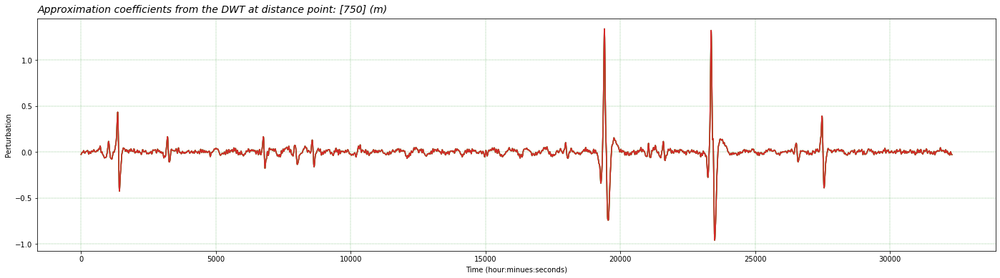

In [ ]:
#Example: PLOT the cA (Approximation coefficients)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
ax.plot(cA)#, linestyle='-', marker='.')
ax.set_title(label="Approximation coefficients from the DWT at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

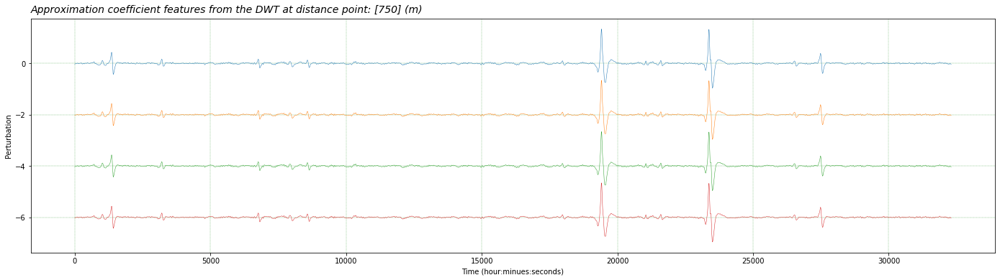

In [ ]:
#Example: PLOT the cA (Approximation coefficients) in detail
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
#ax.plot(cA, linestyle='-', marker='.')
ax.plot(cA[:,0], linestyle='solid',linewidth=0.5)
ax.plot(cA[:,1]-2, linestyle='solid',linewidth=0.5)
ax.plot(cA[:,2]-4, linestyle='solid',linewidth=0.5)
ax.plot(cA[:,3]-6, linestyle='solid',linewidth=0.5)
ax.set_title(label="Approximation coefficient features from the DWT at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
print(cD.shape)
cD[:,0]#first colum

(32304, 4)


array([-8.67361738e-19,  1.49077799e-18, -4.60785923e-19, ...,
       -1.08420217e-19,  8.40256684e-19, -1.16551734e-18])

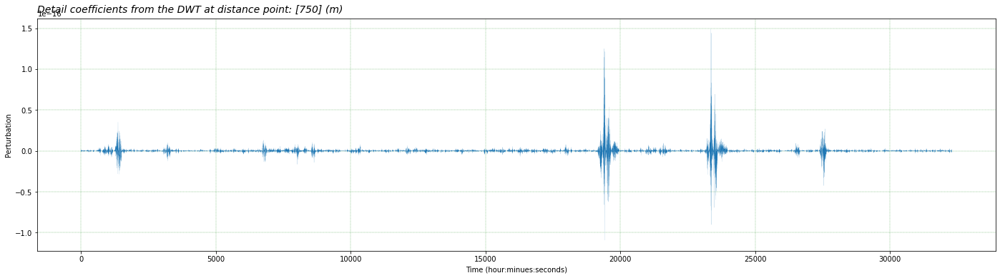

In [ ]:
#Example: PLOT the cD_0 (Detail coefficients)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
#ax.plot(cD)#, linestyle='-', marker='.')
#cD[:,0]
ax.plot(cD[:,0], linestyle='solid',linewidth=0.1)
#ax.plot(cD[:,1], linestyle='solid',linewidth=0.1)
#ax.plot(cD[:,2], linestyle='solid',linewidth=0.1)
#ax.plot(cD[:,3], linestyle='solid',linewidth=0.1)
ax.set_title(label="Detail coefficients from the DWT at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

#filename='medida_220613_15_42_42.mat': For this samples the videorecording readings show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#metro= 750

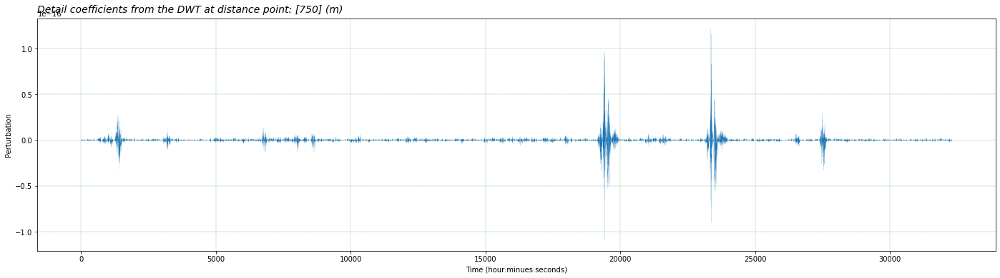

In [ ]:
#Example: PLOT the cD_1 (Detail coefficients)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
#ax.plot(cD)#, linestyle='-', marker='.')
#cD[:,0]
#ax.plot(cD[:,0], linestyle='solid',linewidth=0.1)
ax.plot(cD[:,1], linestyle='solid',linewidth=0.1)
#ax.plot(cD[:,2], linestyle='solid',linewidth=0.1)
#ax.plot(cD[:,3], linestyle='solid',linewidth=0.1)
ax.set_title(label="Detail coefficients from the DWT at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

#filename='medida_220613_15_42_42.mat': For this samples the videorecording readings show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#metro= 750

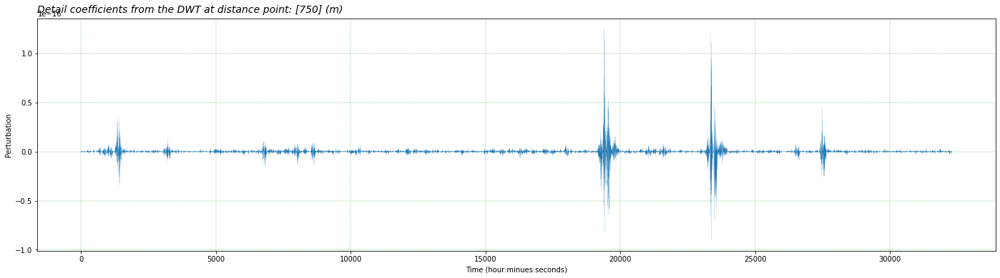

In [ ]:
#Example: PLOT the cD_2 (Detail coefficients)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
#ax.plot(cD)#, linestyle='-', marker='.')
#cD[:,0]
#ax.plot(cD[:,0], linestyle='solid',linewidth=0.1)
#ax.plot(cD[:,1], linestyle='solid',linewidth=0.1)
ax.plot(cD[:,2], linestyle='solid',linewidth=0.1)
#ax.plot(cD[:,3], linestyle='solid',linewidth=0.1)
ax.set_title(label="Detail coefficients from the DWT at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

#filename='medida_220613_15_42_42.mat': For this samples the videorecording readings show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#metro= 750

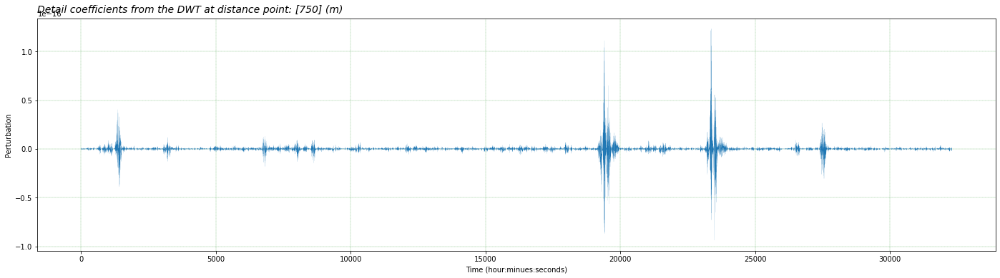

In [ ]:
#Example: PLOT the cD_3 (Detail coefficients)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
#ax.plot(cD)#, linestyle='-', marker='.')
#cD[:,0]
#ax.plot(cD[:,0], linestyle='solid',linewidth=0.1)
#ax.plot(cD[:,1], linestyle='solid',linewidth=0.1)
#ax.plot(cD[:,2], linestyle='solid',linewidth=0.1)
ax.plot(cD[:,3], linestyle='solid',linewidth=0.1)
ax.set_title(label="Detail coefficients from the DWT at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

#filename='medida_220613_15_42_42.mat': For this samples the videorecording readings show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#metro= 750

In [ ]:
cD[maskrows,3]
#maskrows.shape

array([-9.75781955e-19,  6.23416249e-19,  7.31836466e-19, ...,
       -8.67361738e-19,  1.38235777e-18, -8.40256684e-19])

Could the distance between peaks be axles?

white truck


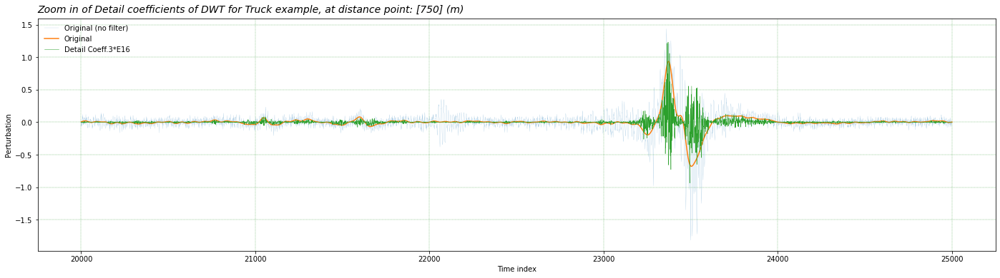

In [ ]:
#Example: PLOT the cD_3 (Detail coefficients), but ZOOM in
#Zoom in for second truck DAS signal, from meter 750m from sample 20000 to 25000
print('white truck')
#--- TIME Data ---
start_date=str(Fp.iloc[20000].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[25000].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
ax.plot(Original_nf.loc[maskrows, maskcols][724],label='Original (no filter)',linestyle='solid',linewidth=0.2, alpha=0.5)
ax.plot(Original.loc[maskrows, maskcols][724],label='Original')

coeff3=pd.DataFrame(cD[maskrows,3], index=Original.loc[maskrows, maskcols][724].index)
ax.plot(coeff3*10000000000000000, linestyle='solid',linewidth=0.5, label='Detail Coeff.3*E16')

ax.set_title(label="Zoom in of Detail coefficients of DWT for Truck example, at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time index",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

White truck example


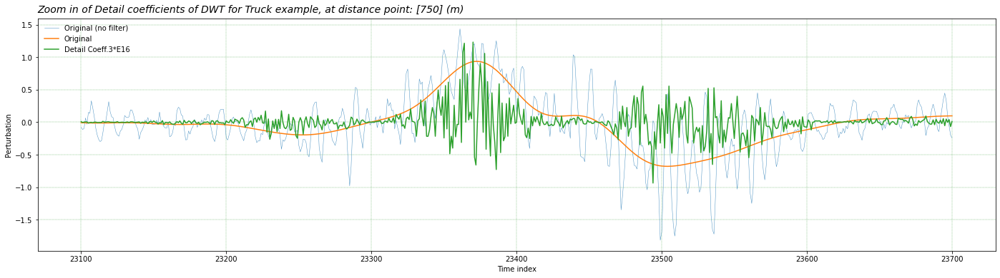

In [ ]:
#Example: PLOT the cD_3 (Detail coefficients), but ZOOM in
#Zoom in for second truck DAS signal, from meter 750m from sample 23100 to 23700
print('White truck example')
#--- TIME Data ---
start_date=str(Fp.iloc[23100].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[23700].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
ax.plot(Original_nf.loc[maskrows, maskcols][724],label='Original (no filter)',linestyle='solid',linewidth=0.5, alpha=0.8)
ax.plot(Original.loc[maskrows, maskcols][724],label='Original')

coeff3=pd.DataFrame(cD[maskrows,3], index=Original.loc[maskrows, maskcols][724].index)
ax.plot(coeff3*10000000000000000, linestyle='solid',linewidth=1.5, label='Detail Coeff.3*E16')

ax.set_title(label="Zoom in of Detail coefficients of DWT for Truck example, at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time index",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
Original.loc[maskrows, maskcols].iloc[indexes]#idem a.loc[23100+272])

,724
23372,0.934993


In [ ]:
#Array
data3 = Original.loc[maskrows, maskcols].abs().values #numpy.ndarray
data3 = Original.loc[maskrows, maskcols].values #numpy.ndarray
#MAX and MIN of array
print('len(data3): ',len(data3))
print('max(data3): ',max(data3))
print('min(data3): ',min(data3))
#MAX and MIN of dataframe
print('len(Original.loc[maskrows, maskcols]): ',len(Original.loc[maskrows, maskcols]))
print('max(Original.loc[maskrows, maskcols]): ',Original.loc[maskrows, maskcols].max())
print('min(Original.loc[maskrows, maskcols]): ',Original.loc[maskrows, maskcols].min())
#detected PEAKS
print('indexes   : ',indexes)
print('Values    : ',Original.loc[maskrows, maskcols].iloc[indexes])
print('Original.iloc[23372,724]:',Original.iloc[23372,724])

len(data3):  601
max(data3):  [0.93499347]
min(data3):  [-0.67937451]
len(Original.loc[maskrows, maskcols]):  601
max(Original.loc[maskrows, maskcols]):  724    0.934993
dtype: float64
min(Original.loc[maskrows, maskcols]):  724   -0.679375
dtype: float64
indexes   :  [272]
Values    :              724
23372  0.934993
Original.iloc[23372,724]: 0.9349934667737803


In [ ]:
type(Original.loc[maskrows, maskcols][724])

pandas.core.series.Series

In [ ]:
type(Original.loc[maskrows, maskcols])

pandas.core.frame.DataFrame

In [ ]:
Original.iloc[indexes,maskcols]

,724
272,-0.01235


In [ ]:
Original.iloc[indexes,maskcols].abs()

,724
272,0.01235


White truck example
threshold:  [0.07486683]  Min. Number of samples between peaks:  200 Number of peaks:  1  peaks: [272]


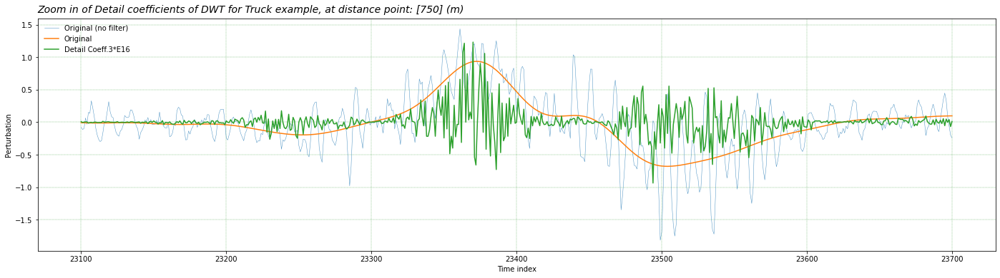

In [ ]:
#Example: PLOT the PEAKS of the Zoom in for second truck DAS signal, from meter 750m from sample 23100 to 23700
print('White truck example')
#--- TIME Data ---
start_date=str(Fp.iloc[23100].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[23700].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- PEAKS ---
data3 = Original.loc[maskrows, maskcols].abs().values #numpy.ndarray
thres=0.07/max(data3)
min_sample_dist=200 #min number of samples between peaks
indexes = peakutils.indexes(np.add.reduce(data3, axis = 1), thres, min_sample_dist)
print('threshold: ',thres,' Min. Number of samples between peaks: ',min_sample_dist, 'Number of peaks: ',len(indexes),' peaks:', indexes)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
ax.plot(Original_nf.loc[maskrows, maskcols][724],label='Original (no filter)',linestyle='solid',linewidth=0.5, alpha=0.8)
ax.plot(Original.loc[maskrows, maskcols][724],label='Original')
#ax.plot(Original.iloc[indexes,maskcols].abs(),linestyle='-',marker='o', markerfacecolor='black',label='Peaks')

coeff3=pd.DataFrame(cD[maskrows,3], index=Original.loc[maskrows, maskcols][724].index)
ax.plot(coeff3*10000000000000000, linestyle='solid',linewidth=1.5, label='Detail Coeff.3*E16')

ax.set_title(label="Zoom in of Detail coefficients of DWT for Truck example, at distance point: "+str(distance_points)+" (m)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time index",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

**Multi-level Discrete Wavelet Transform (wavedec)**

In [ ]:
########################################################
### Multi-level Discrete Wavelet Transform (wavedec) ###
########################################################
#Reference Plot example of one DAS measurement from meter 750m at all times
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- Multi-level Discrete Wavelet Transform (wavedec) ---
coeffs = pywt.wavedec(Fp.loc[maskrows, maskcols].values, 'db4',level=2, mode='zero')
CA2, CD2, CD1 =coeffs
#--- Inverse  Wavelet Transform (idwt)  ---
y=pywt.waverec(coeffs,'db4', mode='zero')

/usr/local/lib/python3.8/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 2 is too high: all coefficients will experience boundary effects.
  warnings.warn(


In [ ]:
#Explore the coefficients
#
#Approximation coefficients
#CA2.shape#(32304, 5)
#Take each col apart
#print(CA2[:,0])#[-5.88061232e-05 -5.86377043e-05 -5.83993707e-05 ... -6.38919185e-05 -6.40369553e-05 -6.40772282e-05]
#print(CA2[:,1])#[-0.00012257 -0.00012222 -0.00012173 ... -0.00013317 -0.00013348 -0.00013356]
#print(CA2[:,2])#[0.00163002 0.00162535 0.00161875 ... 0.00177099 0.00177501 0.00177613]
#print(CA2[:,3])#[-0.00509548 -0.00508089 -0.00506024 ... -0.00553616 -0.00554873 -0.00555222]
#print(CA2[:,4])#[-0.00595141 -0.00593437 -0.00591025 ... -0.00646611 -0.00648079  -0.00648487]
#CA2[:,4].shape #(32304,)
#
#Detail coefficients
#CD2.shape#(32304, 5)
#CD1.shape#(32304, 4)
print('Approximation coefficients: ',CA2)
print('CA2.shape',CA2.shape)
print('Detail coefficients: ',CD2)
print('CD2.shape',CD2.shape)
print('Detail coefficients: ',CD1)
print('CD1.shape',CD1.shape)
print('Inverse  Wavelet Transform (idwt)',y)

Approximation coefficients:  [[-5.88061232e-05 -1.22573056e-04  1.63001989e-03 -5.09548414e-03
  -5.95141234e-03]
 [-5.86377043e-05 -1.22222011e-04  1.62535156e-03 -5.08089082e-03
  -5.93436768e-03]
 [-5.83993707e-05 -1.21725238e-04  1.61874530e-03 -5.06023949e-03
  -5.91024738e-03]
 ...
 [-6.38919185e-05 -1.33173678e-04  1.77099071e-03 -5.53616255e-03
  -6.46611495e-03]
 [-6.40369553e-05 -1.33475987e-04  1.77501092e-03 -5.54872983e-03
  -6.48079325e-03]
 [-6.40772282e-05 -1.33559930e-04  1.77612722e-03 -5.55221943e-03
  -6.48486902e-03]]
CA2.shape (32304, 5)
Detail coefficients:  [[-0.00127839 -0.00988592  0.00378101 -0.00131204  0.00027377]
 [-0.00127473 -0.00985761  0.00377018 -0.00130828  0.00027298]
 [-0.00126955 -0.00981755  0.00375485 -0.00130296  0.00027187]
 ...
 [-0.00138895 -0.0107409   0.004108   -0.00142551  0.00029744]
 [-0.0013921  -0.01076528  0.00411733 -0.00142874  0.00029812]
 [-0.00139298 -0.01077205  0.00411992 -0.00142964  0.0002983 ]]
CD2.shape (32304, 5)
Detail 

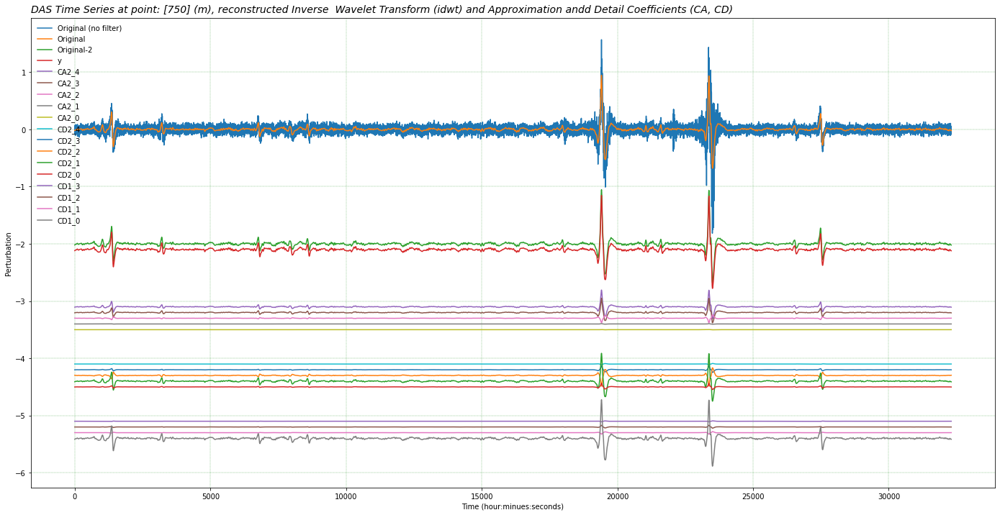

In [ ]:
#PLOT: plot original vs reconstructed signal "y" (Multi-level Discrete Wavelet Transform (wavedec)) and coefficients
#plot is show with different OFFSETS to be able to observe them
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 12))
ax.plot(Original_nf.loc[maskrows, maskcols][724],label='Original (no filter)')
ax.plot(Original.loc[maskrows, maskcols][724],label='Original')
#ax.plot(y[:,0]-1, label='y-1')#, linestyle='-', marker='.')
#ax.plot(CA2, label='CA2')#, linestyle='-', marker='.')
#ax.plot(CD2, label='CD2')#, linestyle='-', marker='.')
#ax.plot(CD1, label='CD1')#, linestyle='-', marker='.')
ax.plot(Original.loc[maskrows, maskcols][724]-2,label='Original-2')
ax.plot(y[:,0]-2.1, label='y')#, linestyle='-', marker='.')
ax.plot(CA2[:,4]-3.1, label='CA2_4')#, linestyle='-', marker='.')
ax.plot(CA2[:,3]-3.2, label='CA2_3')#, linestyle='-', marker='.')
ax.plot(CA2[:,2]-3.3, label='CA2_2')#, linestyle='-', marker='.')
ax.plot(CA2[:,1]-3.4, label='CA2_1')#, linestyle='-', marker='.')
ax.plot(CA2[:,0]-3.5, label='CA2_0')#, linestyle='-', marker='.')

ax.plot(CD2[:,4]-4.1, label='CD2_4')#, linestyle='-', marker='.')
ax.plot(CD2[:,3]-4.2, label='CD2_3')#, linestyle='-', marker='.')
ax.plot(CD2[:,2]-4.3, label='CD2_2')#, linestyle='-', marker='.')
ax.plot(CD2[:,1]-4.4, label='CD2_1')#, linestyle='-', marker='.')
ax.plot(CD2[:,0]-4.5, label='CD2_0')#, linestyle='-', marker='.')

ax.plot(CD1[:,3]-5.1, label='CD1_3')#, linestyle='-', marker='.')
ax.plot(CD1[:,2]-5.2, label='CD1_2')#, linestyle='-', marker='.')
ax.plot(CD1[:,1]-5.3, label='CD1_1')#, linestyle='-', marker='.')
ax.plot(CD1[:,0]-5.4, label='CD1_0')#, linestyle='-', marker='.')

ax.set_title(label="DAS Time Series at point: "+str(distance_points)+" (m), reconstructed Inverse  Wavelet Transform (idwt) and Approximation andd Detail Coefficients (CA, CD)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
#filename='medida_220613_15_42_42.mat': For this samples the videorecording readings show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#metro= 750

**Test with the noisy (not filtered) data**

In [ ]:
#idem (not filtered) data
########################################################
### Multi-level Discrete Wavelet Transform (wavedec) ###
### Similar Test with the noisy (not filtered) data ####
########################################################
signal = Original_nf.loc[maskrows, maskcols].values
wavelet="db4"

#--- Multi-level Discrete Wavelet Transform (wavedec) ---
#coeff = pywt.wavedec(signal, wavelet, mode="per", level=0 )
coeff = pywt.wavedec(signal, wavelet, level=2, mode='zero')
CA2, CD2, CD1 =coeff
print(CA2.shape)#(32304, 5)
print(CD2.shape)#(32304, 5)
print(CD1.shape)#(32304, 4)
#--- Inverse  Wavelet Transform (idwt)  ---
y=pywt.waverec(coeff,'db4', mode='zero')

In [ ]:
#PLOT: plot original (This time noisy) vs reconstructed signal "y" (Multi-level Discrete Wavelet Transform (wavedec)) and coefficients
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 12))
ax.plot(Original_nf.loc[maskrows, maskcols][724],label='Original (no filter)')
ax.plot(Original.loc[maskrows, maskcols][724],label='Original')
#ax.plot(y[:,0]-1, label='y-1')#, linestyle='-', marker='.')
#ax.plot(CA2, label='CA2')#, linestyle='-', marker='.')
#ax.plot(CD2, label='CD2')#, linestyle='-', marker='.')
#ax.plot(CD1, label='CD1')#, linestyle='-', marker='.')
ax.plot(Original_nf.loc[maskrows, maskcols][724]-2,label='Original (no filter)-2')
ax.plot(y[:,0]-2.1, label='y')#, linestyle='-', marker='.')
ax.plot(CA2[:,4]-3.1, label='CA2_4')#, linestyle='-', marker='.')
ax.plot(CA2[:,3]-3.2, label='CA2_3')#, linestyle='-', marker='.')
ax.plot(CA2[:,2]-3.3, label='CA2_2')#, linestyle='-', marker='.')
ax.plot(CA2[:,1]-3.4, label='CA2_1')#, linestyle='-', marker='.')
ax.plot(CA2[:,0]-3.5, label='CA2_0')#, linestyle='-', marker='.')

ax.plot(CD2[:,4]-4.1, label='CD2_4')#, linestyle='-', marker='.')
ax.plot(CD2[:,3]-4.2, label='CD2_3')#, linestyle='-', marker='.')
ax.plot(CD2[:,2]-4.3, label='CD2_2')#, linestyle='-', marker='.')
ax.plot(CD2[:,1]-4.4, label='CD2_1')#, linestyle='-', marker='.')
ax.plot(CD2[:,0]-4.5, label='CD2_0')#, linestyle='-', marker='.')

ax.plot(CD1[:,3]-5.1, label='CD1_3')#, linestyle='-', marker='.')
ax.plot(CD1[:,2]-5.2, label='CD1_2')#, linestyle='-', marker='.')
ax.plot(CD1[:,1]-5.3, label='CD1_1')#, linestyle='-', marker='.')
ax.plot(CD1[:,0]-5.4, label='CD1_0')#, linestyle='-', marker='.')

ax.set_title(label="DAS Time Series at point: "+str(distance_points)+" (m), reconstructed Inverse  Wavelet Transform (idwt) and Approximation andd Detail Coefficients (CA, CD)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
#Test with the noisy (not filtered) data
###########################################################
### Multi-level Discrete Wavelet Transform (wavedec)    ###
### lowpassfilter to apply to noisy (not filtered) data ###
###########################################################

#def lowpassfilter(signal, thresh = 0.63, wavelet="db4"):
def lowpassfilter(signal, thresh = 0.075, wavelet="db4"):
  print(thresh)
  thresh = thresh*np.nanmax(signal)
  print(thresh)
  #coeff = pywt.wavedec(signal, wavelet, mode="per")
  coeff = pywt.wavedec(signal, wavelet, mode="per", level=0 )
  #coeff[1:] = (pywt.threshold(i, value=thresh, mode="soft" ) for i in coeff[1:])
  #coeff[0:] = (pywt.threshold(i, value=thresh, mode="soft" ) for i in coeff[0:])
  coeff[0:] = (pywt.threshold(i, value=thresh, mode="soft" ) for i in coeff[0:])
  #reconstructed_signal = pywt.waverec(coeff, wavelet, mode="per" )
  #reconstructed_signal = pywt.waverec(coeff[1:], wavelet, mode="per" )
  reconstructed_signal = pywt.waverec(coeff, wavelet, mode="zero")
  return reconstructed_signal
    
#Reference Plot example of one DAS measurement from meter 750m at all times
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24,12))
ax.plot(Original_nf.loc[maskrows, maskcols][724],label='Original (no filter)')
ax.plot(Original.loc[maskrows, maskcols][724],label='Original')
ax.plot(signal-2, color="b", alpha=0.5, label='signal-2')

signal = Original_nf.loc[maskrows, maskcols].values
#DWT smoothing
#rec = lowpassfilter(signal, 0.4)
#rec = lowpassfilter(signal, 0.075)
rec = lowpassfilter(signal, 0.075)
ax.plot(rec-2, 'k', label='DWT smoothing-2', linewidth=1)
ax.plot(CA2[:,4]-3.1, label='CA2_4')#, linestyle='-', marker='.')
ax.plot(CA2[:,3]-3.2, label='CA2_3')#, linestyle='-', marker='.')
ax.plot(CA2[:,2]-3.3, label='CA2_2')#, linestyle='-', marker='.')
ax.plot(CA2[:,1]-3.4, label='CA2_1')#, linestyle='-', marker='.')
ax.plot(CA2[:,0]-3.5, label='CA2_0')#, linestyle='-', marker='.')

ax.plot(CD2[:,4]-4.1, label='CD2_4')#, linestyle='-', marker='.')
ax.plot(CD2[:,3]-4.2, label='CD2_3')#, linestyle='-', marker='.')
ax.plot(CD2[:,2]-4.3, label='CD2_2')#, linestyle='-', marker='.')
ax.plot(CD2[:,1]-4.4, label='CD2_1')#, linestyle='-', marker='.')
ax.plot(CD2[:,0]-4.5, label='CD2_0')#, linestyle='-', marker='.')

ax.plot(CD1[:,3]-5.1, label='CD1_3')#, linestyle='-', marker='.')
ax.plot(CD1[:,2]-5.2, label='CD1_2')#, linestyle='-', marker='.')
ax.plot(CD1[:,1]-5.3, label='CD1_1')#, linestyle='-', marker='.')
ax.plot(CD1[:,0]-5.4, label='CD1_0')#, linestyle='-', marker='.')

ax.legend(loc='upper left', frameon=False)
ax.set_title('Removing High Frequency Noise with DWT', fontsize=14)
ax.set_ylabel('Signal Amplitude', fontsize=12)
ax.set_xlabel('Sample No', fontsize=12)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
#Zoom in for second truck DAS signal, from meter 750m from sample 20000 to 25000
print('white truck')
#--- TIME Data ---
start_date=str(Fp.iloc[20000].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[25000].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()

#--- DWT smoothing ---
signal = Original_nf.loc[maskrows, maskcols].values
#rec = lowpassfilter(signal, 0.075)
#rec = lowpassfilter(signal, 0.18)
rec = lowpassfilter(signal, 0.10)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
ax.plot(Original_nf.loc[maskrows, maskcols][724],label='Original (no filter)')
ax.plot(Original.loc[maskrows, maskcols][724],label='Original')

signaldf=pd.DataFrame(signal, index=Original.loc[maskrows, maskcols][724].index)
recdf=pd.DataFrame(rec, index=Original.loc[maskrows, maskcols][724].index)

ax.plot(signaldf-1, color="b", alpha=0.5, label='signal')
ax.plot(recdf-1, 'k', label='DWT smoothing', linewidth=1)
  
ax.set_title(label="DAS Time Series measurement zoom in at distance point: "+str(distance_points)+" (m), from sample 20000 to 25000",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Sample No.",
       ylabel="Signal Amplitude")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
#DWT smoothing Test with the noisy (not filtered) data

#def lowpassfilter(signal, thresh = 0.63, wavelet="db4"):
def lowpassfilter(signal, thresh = 0.02, wavelet="db4"):
  print('original threshold:',thresh)
  thresh = thresh*np.nanmax(signal)
  print('resulting threshold: ',thresh)
  #coeff = pywt.wavedec(signal, wavelet, mode="per")
  coeff = pywt.wavedec(signal, wavelet, mode="zero", level=1 )
  #coeff[1:] = (pywt.threshold(i, value=thresh, mode="soft" ) for i in coeff[1:])
  #coeff[0:] = (pywt.threshold(i, value=thresh, mode="soft" ) for i in coeff[0:])
  coeff[1:] = (pywt.threshold(i, value=thresh, mode="soft" ) for i in coeff[1:])
  #reconstructed_signal = pywt.waverec(coeff, wavelet, mode="per" )
  #reconstructed_signal = pywt.waverec(coeff[1:], wavelet, mode="per" )
  reconstructed_signal = pywt.waverec(coeff, wavelet, mode="zero")
  return reconstructed_signal
    
#Reference Plot example of one DAS measurement from meter 750m at all times
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24,6))
ax.plot(Original_nf.loc[maskrows, maskcols][724],label='Original (no filter)')
ax.plot(Original.loc[maskrows, maskcols][724],label='Original')

signal = Original_nf.loc[maskrows, maskcols].values
ax.plot(signal-2, color="b", alpha=0.5, label='signal-1')
#print(type(signal))

#rec = lowpassfilter(signal, 0.075)
rec = lowpassfilter(signal, 0.75)
#rec2=np.array(list(dict(rec).values())).astype(float)
rec2=[tup[0]-2 for tup in rec]
ax.plot(rec2, 'k', label='DWT smoothing-2', linewidth=1)

ax.legend(loc='upper left', frameon=False)
ax.set_title('Removing High Frequency Noise with DWT', fontsize=14)
ax.set_ylabel('Signal Amplitude', fontsize=12)
ax.set_xlabel('Sample No', fontsize=12)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
#wavelet_denoising functions
def madev(d, axis=None):
    """ Mean absolute deviation of a signal """
    return np.mean(np.absolute(d - np.mean(d, axis)), axis)

def wavelet_denoising(x, wavelet='db4', level=1):
    coeff = pywt.wavedec(x, wavelet, mode="per")
    #sigma = (1/0.6745) * madev(coeff[-level])
    sigma = (1/50) * madev(coeff[-level])
    #print(sigma)
    uthresh = sigma * np.sqrt(2 * np.log(len(x)))
    #print('uthresh',uthresh)
    #print('coeff1', coeff)
    #coeff[1:] = (pywt.threshold(i, value=uthresh, mode='hard') for i in coeff[1:])
    #coeff[:1] = (pywt.threshold(i, value=uthresh, mode='hard') for i in coeff[:1])
    #coeff[:1][0] = (pywt.threshold(i, value=uthresh, mode='hard') for i in coeff[:1][0])
    #flat_list = [item for sublist in coeff for item in sublist]
    flat_list = list(np.concatenate(coeff).flat)
    coeff2 = [pywt.threshold(i, value=uthresh, mode='hard') for i in flat_list]
    #print('coeff2', coeff2)
    return pywt.waverec(coeff, wavelet, mode='per')

In [ ]:
#wavelet_denoising TEST
signal = Original_nf.loc[maskrows, maskcols].values
rec3= wavelet_denoising(signal, wavelet='db4', level=1)

#--- PLOT ---
fig, ax = plt.subplots(figsize=(24,6))
ax.plot(Original_nf.loc[maskrows, maskcols][724],label='Original (no filter)')
ax.plot(Original.loc[maskrows, maskcols][724],label='Original')
ax.plot(signal-3, color="b", alpha=0.5, label='signal-1')
ax.plot(rec3-3, 'k', label='DWT smoothing-3', linewidth=0.2)
ax.legend(loc='upper left', frameon=False)
ax.set_title('Removing High Frequency Noise with DWT', fontsize=14)
ax.set_ylabel('Signal Amplitude', fontsize=12)
ax.set_xlabel('Sample No', fontsize=12)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
#Vehicles recorded by VIDEO 'medida_220613_15_42_42.MOV' , reference point 750m:
#VIDEO time 02:18: vehicle (direction Aoiz, far from fiber), 02:25-02:18=7sec, 100km/h*7sec=0.1944km=194.4m after, 750m+194.4m=944m
#VIDEO time 02:25: vehicle (direction Pamplona, near fiber), 750m
#VIDEO time 02:54: vehicle (direction Aoiz, far from fiber), 02:54-02:25=29sec, 100km/h*29sec=0.8055km=850.5m before, 750m-850.5m=-55.5m (out of range at the measuring moment)

#filename='medida_220613_15_42_42.MOV': From this samples the videorecording readings (that show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<) in 3 minutes).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#VIDEO time:                                                                                                                                 02:18  02:25

#We can observe at the time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
#VEH.DIR                                                                                                                                      <      >                         
#VEH.t [                                                                                                                                     139.0, 146.0,                       ]
#VIDEO time:6 8 9          00:17          00:36  00:41 00:45                                       01:34  01:41(h) 01:50 01:53 02:02(h)      02:18  02:25                    02:54
#metro:   

In space...

In [ ]:
print('--Fp y Original--')
print('Fp',Fp.shape)
print('Original',Original.shape)

print('--maskrows--')
print(maskrows, end = '')
print(maskrows.shape)
#print(type(maskrows))#<class 'numpy.ndarray'>
print('TRUE:',np.count_nonzero(maskrows))

print('--maskcols--')
print(maskcols, end = '')
print(maskcols.shape)
#print(type(maskcols))#<class 'numpy.ndarray'>
print('TRUE:',np.count_nonzero(maskcols))

#--- signal
print('--signal--')
signal = Original.loc[maskrows, maskcols].values
#print(signal)
print(signal.shape)
#print(type(signal))#<class 'numpy.ndarray'>

In [ ]:
#Example: Plot an example of a vehicle (direction away from Pamplona, further away from the fiber), heavy vehicle
#Transpose: DAS Example in space: White truck
Fp_T = Fp.T
Fp_nf_T = Fp_nf.T
#--- TIME Data ---
time_points = np.array(['2022-06-13 15:44:44.210088'], dtype='datetime64[ns]')#equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskrows = (Fp_T.index >= start_distance) & (Fp_T.index <= end_distance)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp_T.loc[maskrows, maskcols].columns.values:
  print(i)
  ax.plot(Fp_T.loc[maskrows, maskcols][i],label=Fp_T.loc[maskrows, maskcols][i].name)#, linestyle='-', marker='.')
ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
#ax.invert_xaxis()
#--- IMAGE ---
filename='2022-06-13T15_44_44_Heavy_Truck.PNG'
auxfolder='./drive/MyDrive/INGESTION/Notebook_Auxfiles'
file=os.path.join(auxfolder, filename)
myimage = image.imread(file) #print(myimage.shape)
imagebox = OffsetImage(myimage, zoom = 0.38)
ab = AnnotationBbox(imagebox, (0.45, 0.26), frameon = False)
ax1 = fig.add_axes([0.2, 0.6, 0.2, 0.2])
ax1.add_artist(ab)
ax1.axis('off')
#--- SHOW ---
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

In [ ]:
Fp_T

In [ ]:
########################################################
### Multi-level Discrete Wavelet Transform (wavedec) ###
########################################################
#Reference Plot example of one DAS measurement at a single moment (time: ) for all distances (100, 1000) except the first wrong measuring meters
#--- TIME Data ---
time_points = np.array(['2022-06-13 15:44:44.210088'], dtype='datetime64[ns]')#equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskrows = (Fp_T.index >= start_distance) & (Fp_T.index <= end_distance)

#--- Multi-level Discrete Wavelet Transform (wavedec) ---
coeffs = pywt.wavedec(Fp_T.loc[maskrows, maskcols].values, 'db4',level=2, mode='zero')
CA2, CD2, CD1 =coeffs
#--- Inverse  Wavelet Transform (idwt)  ---
y=pywt.waverec(coeffs,'db4', mode='zero')

In [ ]:
print('Fp_T.loc[maskrows, maskcols].shape',Fp_T.loc[maskrows, maskcols].shape)
print('y.shape',y.shape)

In [ ]:
#PLOT: plot original vs reconstructed signal "y" (Multi-level Discrete Wavelet Transform (wavedec)) and coefficients
#plot is show with different OFFSETS to be able to observe them
Original_T = Original.T
Original_nf_T = Original_nf.T

Fp_T = Fp.T
Fp_nf_T = Fp_nf.T

#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 12))
#ax.plot(Original_nf_T.loc[maskrows, maskcols][23500],label='Original (no filter)')
#ax.plot(Original_T.loc[maskrows, maskcols][23500],label='Original') #'2022-06-13 15:44:44.210088'equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m
ax.plot(Fp_nf_T.loc[maskrows, maskcols]['2022-06-13 15:44:44.210088'],label='Original (no filter)')
ax.plot(Fp_T.loc[maskrows, maskcols]['2022-06-13 15:44:44.210088'],label='Original')
 
#ax.plot(Original_T.loc[maskrows, maskcols][23500]-2,label='Original-2')
ax.plot(Fp_T.loc[maskrows, maskcols]['2022-06-13 15:44:44.210088']-2,label='Original-2')
ax.plot(y[:,0]-2.1, label='y')#, linestyle='-', marker='.')
ax.plot(CA2[:,4]-3.1, label='CA2_4')#, linestyle='-', marker='.')
ax.plot(CA2[:,3]-3.2, label='CA2_3')#, linestyle='-', marker='.')
ax.plot(CA2[:,2]-3.3, label='CA2_2')#, linestyle='-', marker='.')
ax.plot(CA2[:,1]-3.4, label='CA2_1')#, linestyle='-', marker='.')
ax.plot(CA2[:,0]-3.5, label='CA2_0')#, linestyle='-', marker='.')

ax.plot(CD2[:,4]-4.1, label='CD2_4')#, linestyle='-', marker='.')
ax.plot(CD2[:,3]-4.2, label='CD2_3')#, linestyle='-', marker='.')
ax.plot(CD2[:,2]-4.3, label='CD2_2')#, linestyle='-', marker='.')
ax.plot(CD2[:,1]-4.4, label='CD2_1')#, linestyle='-', marker='.')
ax.plot(CD2[:,0]-4.5, label='CD2_0')#, linestyle='-', marker='.')

ax.plot(CD1[:,3]-5.1, label='CD1_3')#, linestyle='-', marker='.')
ax.plot(CD1[:,2]-5.2, label='CD1_2')#, linestyle='-', marker='.')
ax.plot(CD1[:,1]-5.3, label='CD1_1')#, linestyle='-', marker='.')
ax.plot(CD1[:,0]-5.4, label='CD1_0')#, linestyle='-', marker='.')

ax.set_title(label="DAS Time Series at point: "+str(distance_points)+" (m), reconstructed Inverse  Wavelet Transform (idwt) and Approximation andd Detail Coefficients (CA, CD)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Time (hour:minues:seconds)",
       ylabel="Perturbation")#,
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
plt.show()

In [ ]:
### SCALOGRAM  #####
#Example White truck
#--- TIME Data ---
#start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'
#end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'
#maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,..., False, False])
time_points = np.array(['2022-06-13 15:44:44.210088'], dtype='datetime64[ns]')
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
#Adding a list of approximate points (in meters) to get the nearer columns
#distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- SCALOGRAM Functions ---
# Find the highest power of two less than or equal to the input.
def lepow2(x):
    return 2 ** floor(log2(x))
#print('lepow2(len(signal))',lepow2(len(signal)))

# Make a scalogram given an MRA tree of coefficients.
def scalogram(data):
    bottom = 0
    fig, ax = plt.subplots(figsize=(24,12))
    plt.gca().set_autoscale_on(False)
    for row in range(0, len(data)): #len(flattree):7
        scale = 2.0 ** (row - len(data))#0.0078125 ,0.015625 ,0.03125 ,0.0625 ,0.125 ,0.25 ,0.5 
        ax.imshow(np.array([abs(data[row])]),
               interpolation = 'nearest',
               extent = [0, 1, bottom, bottom + scale])
        bottom += scale

# Load the signal, take the first channel, limit length to a power of 2 for simplicity.
#signal = signal[0:lepow2(len(signal))]

#Multilevel 1D Discrete Wavelet Transform of data.
#Returns: [cA_n, cD_n, cD_n-1, …, cD2, cD1]list
#Ordered list of coefficients arrays where n denotes the level of decomposition. 
#The first element (cA_n) of the result is approximation coefficients array and 
#the following elements (cD_n - cD_1) are details coefficients arrays
tree = pywt.wavedec(signal, 'db5')

#print('len(tree)',len(tree))
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
#print('len(flattree)',len(flattree))
# Plotting.
plt.gray()
scalogram(flattree)
plt.show()

In [ ]:
#Describe the list of coefficients arrays and the level of decomposition
print("Discrete Wavelet Transform list of coefficients, level of decomposition: ", len(flattree))
for l in range(0,len(tree)):
  if l == 0:
    print('Approximation coefficients array: len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  else:
    print('Detail coefficients array:        len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')

In [ ]:
#--- SCALOGRAM2 Function ---
def scalogram2(signal, data, wavelet):
    f = pylab.figure(figsize=(24, 6))
    f.subplots_adjust(hspace=0.2, bottom=.03, left=.07, right=.97, top=.92)
    #--- PLOT 1 ---
    #pylab.subplot(2, 1, 1)
    pylab.subplot(len(data)+1, 1, 1)
    pylab.title("Signal")
    #pylab.plot(range(0,len(signal)), signal, 'b')
    pylab.plot(signal.T, 'b')
    #pylab.xlim(0, x[-1])
    #--- PLOT 2 ---
    #ax = pylab.subplot(2, 1, 2)
    #level=pywt.dwt_max_level(len(signal.T), wavelet)
    #pylab.title("Wavelet packet coefficients at level %d" % level)
    #plt.gca().set_autoscale_on(False)
    bottom = 0
    interpolation = 'nearest'
    cmap = cm.cool#cm.terrain#cm.cool
    for row in range(0, len(data)): #len(flattree):7
        ax = pylab.subplot(len(data)+1, 1, row+2)
        pylab.title("Wavelet %s coefficients at level %d" %( wavelet, row))
        scale = 2.0 ** (row - len(data))#0.0078125 ,0.015625 ,0.03125 ,0.0625 ,0.125 ,0.25 ,0.5 
        ax.imshow(np.array([abs(data[row])]),
                  interpolation=interpolation,
                  cmap=cmap, aspect="auto",origin="lower",
                  extent = [0, 1, bottom, bottom + scale])#extend:bounding box in data coord. (left, right, bottom, top)
        bottom += scale
    pylab.show()

In [ ]:
### SCALOGRAM  Example in space: Truck #####
#--- TIME Data ---
time_points = np.array(['2022-06-13 15:44:44.210088'], dtype='datetime64[ns]')#equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- Wavelet ---
wavelet = 'db5'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

In [ ]:
#Example: Plot an example of a vehicle (direction Pamplona, near fiber)... and a seconda one in the opposite direcction
#--- TIME Data ---
time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
#start_distance= 600
#end_distance=   900
start_distance= 100
end_distance=   1000
maskrows = (Fp_T.index >= start_distance) & (Fp_T.index <= end_distance)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp_T.loc[maskrows, maskcols].columns.values:
  ax.plot(Fp_T.loc[maskrows, maskcols][i],label=Fp_T.loc[maskrows, maskcols][i].name)#, linestyle='-', marker='.')
ax.set_title(label="DAS measurements for vehicle example at different points (time: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec))",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
ax.invert_xaxis()
#--- IMAGE ---
filename='2022-06-13T15_45_08_Light_dir_right.PNG'
auxfolder='./drive/MyDrive/INGESTION/Notebook_Auxfiles'
file=os.path.join(auxfolder, filename)
myimage = image.imread(file) #print(myimage.shape)
imagebox = OffsetImage(myimage, zoom = 0.38)
#ab = AnnotationBbox(imagebox, (50, 70))#, frameon = False)
ab = AnnotationBbox(imagebox, (0.45, 0.26), frameon = False)
ax1 = fig.add_axes([0.25, 0.65, 0.2, 0.2])
ax1.add_artist(ab)
ax1.axis('off')
#--- SHOW ---
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()
#plt.clf()

In [ ]:
#Vehicles recorded by VIDEO 'medida_220613_15_42_42.MOV' , reference point 750m:
#VIDEO time 02:18: vehicle (direction Aoiz, far from fiber), 02:25-02:18=7sec, 100km/h*7sec=0.1944km=194.4m after, 750m+194.4m=944m
#VIDEO time 02:25: vehicle (direction Pamplona, near fiber), 750m
#VIDEO time 02:54: vehicle (direction Aoiz, far from fiber), 02:54-02:25=29sec, 100km/h*29sec=0.8055km=850.5m before, 750m-850.5m=-55.5m (out of range at the measuring moment)

#filename='medida_220613_15_42_42.MOV': From this samples the videorecording readings (that show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<) in 3 minutes).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197


#We can observe at the time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
#VEH.DIR                                                                                                                                      <      >                         
#VEH.t [                                                                                                                                     139.0, 146.0,                       ]
#VIDEO time:                                                                                                                                 02:18  02:25
#metro:                                                                                                                                       944   750

In [ ]:
### SCALOGRAM  Car #####
#--- TIME Data ---
time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- Wavelet ---
wavelet = 'db5'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

it seems the 4th coeficient could be a good criteria

In [ ]:
#Another example from the animation: 3+1 vehicles (4 cars, 3 to the right, 1 to the left)
#Original = pd.DataFrame(matdf["list"][3])
#Original_nf = pd.DataFrame(matdf_nf["list"][3]) #no filter
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:44:44.210088'], dtype='datetime64[ns]')#white truck
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
#for i in Fp_T.loc[maskrows, maskcols].columns.values:
#  ax.plot(Fp_T.loc[maskrows, maskcols][i],label=Fp_T.loc[maskrows, maskcols][i].name)#, linestyle='-', marker='.')
ax.plot(Original.loc[maskrows, maskcols].T, label= time_points[0])#, linestyle='-', marker='.')
ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
#ax.invert_xaxis()
#--- SHOW ---
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- Wavelet ---
wavelet = 'db5'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

The 4th coeficient seems still useful, except for the vehicle in the opposite direction. What would happen if we reverse the analysis?

In [ ]:
#Another example from the animation: 3+1 vehicles (4 cars, 3 to the right, 1 to the left)
#Original = pd.DataFrame(matdf["list"][3])
#Original_nf = pd.DataFrame(matdf_nf["list"][3]) #no filter
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:44:44.210088'], dtype='datetime64[ns]')#white truck
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
#for i in Fp_T.loc[maskrows, maskcols].columns.values:
#  ax.plot(Fp_T.loc[maskrows, maskcols][i],label=Fp_T.loc[maskrows, maskcols][i].name)#, linestyle='-', marker='.')
##ax.plot(Original.loc[maskrows, maskcols].T, label= time_points[0])#, linestyle='-', marker='.')
ax.plot(Original.loc[maskrows, maskcols].T.iloc[::-1], label= time_points[0])#, linestyle='-', marker='.')# REVERSE .iloc[::-1]

ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
ax.invert_xaxis()
#--- SHOW ---
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles REVERSED (1+3) #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
#signal = Original.loc[maskrows, maskcols].values #array([[1.33279198e-02,  1.97675521e-02,...,, -1.05730349e-02, -5.98952878e-03]) 
#signal = Original.loc[maskrows, maskcols].iloc[::-1]
signal = Original.loc[maskrows, maskcols][Original.loc[maskrows, maskcols].columns[::-1]].values
#--- Wavelet ---
wavelet = 'db5'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

level 3 finds the car in opposite direction without problems

What would happen with other wavelets?

In [ ]:
### SCALOGRAM  3+1 vehicles #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- Wavelet ---
wavelet = 'db4'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles REVERSED (1+3) #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
#signal = Original.loc[maskrows, maskcols].values #array([[1.33279198e-02,  1.97675521e-02,...,, -1.05730349e-02, -5.98952878e-03]) 
#signal = Original.loc[maskrows, maskcols].iloc[::-1]
signal = Original.loc[maskrows, maskcols][Original.loc[maskrows, maskcols].columns[::-1]].values
#--- Wavelet ---
wavelet = 'db4'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- Wavelet ---
wavelet = 'db2'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles REVERSED (1+3) #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
#signal = Original.loc[maskrows, maskcols].values #array([[1.33279198e-02,  1.97675521e-02,...,, -1.05730349e-02, -5.98952878e-03]) 
#signal = Original.loc[maskrows, maskcols].iloc[::-1]
signal = Original.loc[maskrows, maskcols][Original.loc[maskrows, maskcols].columns[::-1]].values
#--- Wavelet ---
wavelet = 'db2'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- Wavelet ---
wavelet = 'sym5'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles REVERSED (1+3) #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
#signal = Original.loc[maskrows, maskcols].values #array([[1.33279198e-02,  1.97675521e-02,...,, -1.05730349e-02, -5.98952878e-03]) 
#signal = Original.loc[maskrows, maskcols].iloc[::-1]
signal = Original.loc[maskrows, maskcols][Original.loc[maskrows, maskcols].columns[::-1]].values
#--- Wavelet ---
wavelet = 'sym5'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- Wavelet ---
wavelet = 'sym7'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles REVERSED (1+3) #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
#signal = Original.loc[maskrows, maskcols].values #array([[1.33279198e-02,  1.97675521e-02,...,, -1.05730349e-02, -5.98952878e-03]) 
#signal = Original.loc[maskrows, maskcols].iloc[::-1]
signal = Original.loc[maskrows, maskcols][Original.loc[maskrows, maskcols].columns[::-1]].values
#--- Wavelet ---
wavelet = 'sym7'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
signal = Original.loc[maskrows, maskcols].values #array([[-0.01919651],[-0.01914153],...,[-0.02204274],[-0.02067354]]) 
#--- Wavelet ---
wavelet = 'coif3'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

In [ ]:
### SCALOGRAM  3+1 vehicles REVERSED (1+3) #####
#--- TIME Data ---
#time_points = np.array(['2022-06-13 15:45:05.010920'], dtype='datetime64[ns]')#light veh. direction Pamplona #video 'medida_220613_15_42_42.MOV', VEH.DIR >, VIDEO time 02:25, VEH.t 146.0, Fp.iloc[27500,:]
time_points = np.array(['2022-06-13 15:42:47.304212'], dtype='datetime64[ns]')#4 cars, 3 to the right, 1 to the left
g = lambda: np.in1d(Fp.loc[:, :].index.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskcols = (Fp.columns >= start_distance) & (Fp.columns <= end_distance)
#--- SIGNAL ---
#signal = Original.loc[maskrows, maskcols].values #array([[1.33279198e-02,  1.97675521e-02,...,, -1.05730349e-02, -5.98952878e-03]) 
#signal = Original.loc[maskrows, maskcols].iloc[::-1]
signal = Original.loc[maskrows, maskcols][Original.loc[maskrows, maskcols].columns[::-1]].values
#--- Wavelet ---
wavelet = 'coif3'
tree = pywt.wavedec(signal, wavelet)
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
plt.gray()
#--- SCALOGRAM call ---
#scalogram(flattree)
scalogram2(signal, flattree, wavelet)
plt.show()

**What would the scalogram result be if we analysed the signal in space?**

In [ ]:
#Example: White Truck
whitetrucktimestamp = '2022-06-13 15:44:44.210088' #equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m
Fp.loc[whitetrucktimestamp]

In [ ]:
### Index equivalent notes ###
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200' [0]
end_date= str(Fp.iloc[-1].name)#'2022-06-13 15:45:29.987520' [32303]
print("For time_points:",start_date,"index name",Fp.index.get_indexer([start_date]),'(first TimeStamp)')
print("For time_points:",end_date,"index name",Fp.index.get_indexer([end_date]),'(last TimeStamp)')
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])

whitetrucktimestamp = '2022-06-13 15:44:44.210088' #equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m
print("For time_points:",whitetrucktimestamp,"index name",Fp.index.get_indexer([whitetrucktimestamp]),'(Truck example TimeStamp)')#whitetruck [724]
print('---')
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200
#print(distance_points)
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()
#--- EQUIVALENT idexes ---
colname= Fp.loc[maskrows, maskcols].columns
#print('col name :',Fp.loc[maskrows, maskcols].columns)#750.000000001819
#print('col index:', Fp.columns.get_loc(750.000000001819))#724
#print("Camera position at col name",Fp[750.000000001819].name, ", equivalent col index:", Fp.columns.get_loc(750.000000001819))
print("For distance_points:",distance_points,"col name",colname, ", equivalent col index: [", Fp.columns.get_loc(colname[0]),'] (Truck example DistanceStamp)')
#col name Float64Index([750.000000001819], dtype='float64') , equivalent col index: 724
#col name Float64Index([100.34482758645026], dtype='float64') , equivalent col index: 96
#col name Float64Index([1000.344827588633], dtype='float64') , equivalent col index: 966

In [ ]:
str(time_points[0])

In [ ]:
#Example: Plot an example of a vehicle (direction away from Pamplona, further away from the fiber), heavy vehicle
#Transpose: DAS Example in space: White truck
#Original = pd.DataFrame(matdf["list"][3])
#Original_nf = pd.DataFrame(matdf_nf["list"][3]) #no filter
Fp_T = Fp.T
Original_T = Original.T
Original_nf_T = Original_nf.T

#--- TIME Data ---
time_points = np.array(['2022-06-13 15:44:44.210088'], dtype='datetime64[ns]') #equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskcols = g()
#--- DISTANCE Data ---
start_distance= 100
end_distance=   1000
maskrows = (Fp_T.index >= start_distance) & (Fp_T.index <= end_distance)
#--- PLOT ---
fig, ax = plt.subplots(figsize=(24, 6))
for i in Fp_T.loc[maskrows, maskcols].columns.values:
  print(i)
  #ax.plot(Fp_T.loc[maskrows, maskcols][i],label=Fp_T.loc[maskrows, maskcols][i].name)#, linestyle='-', marker='.')
  ax.plot(Fp_T.loc[maskrows, maskcols]['2022-06-13 15:44:44.210088'],label='Fp_T')#, linestyle='-', marker='.')
  #df.columns.get_loc("pear")
  #ax.plot(Original_T.loc[maskrows, maskcols]['2022-06-13 15:44:44.210088'],label=Fp_T.loc[maskrows, maskcols][i].name)#, linestyle='-', marker='.')
  ax.plot(Original_T.loc[maskrows, maskcols][23500],label='Original_T')#, linestyle='-', marker='.')
  
#ax.set_title(label="DAS measurements from road shoulder at different time points: "+str(pd.to_datetime(time_points).strftime('%M:%S.%f').values)+" (min:sec)",  
ax.set_title(label="DAS measurements from road shoulder of truck example at : "+str(Fp_T.loc[maskrows, maskcols][i].name)+" ",
             fontsize=14,fontweight=8,#backgroundcolor='lightgrey',
             color="black",loc="left", fontstyle='italic', pad=8) #rotation=45,
ax.legend(loc='upper left', frameon=False)
ax.set(xlabel="Measuring points (meters)",
       ylabel="Perturbation")#,
#ax.invert_xaxis()
#--- SHOW ---
plt.grid(color = 'green', linestyle = '--', linewidth = 0.25)
#plt.savefig("Time Series at different distance points "+str(distance_points))
plt.show()

NOTE: be caregfull, if you are not able to match them then we can assume that you can not use the filtering.

The difference is due to Fp_T having as index the meters, and Original_T having as index an int (which happens to be similar to meters, but not exactly).

In [ ]:
Fp_T.loc[maskrows, maskcols]['2022-06-13 15:44:44.210088'] #equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m

In [ ]:
Original_T.loc[maskrows, maskcols][23500] #equivalent to TimeStamp ['2022-06-13 15:44:44.210088'], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02 in 750m

In [ ]:
Fp_T.loc[maskrows, maskcols]

In [ ]:
Original_T.loc[maskrows, maskcols]

In [ ]:
#Original_T.loc[maskrows, maskcols].values
flatOriginal_T = []
for l in range(0,len(Original_T.loc[maskrows, maskcols].values)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flatOriginal_T.append(Original_T.loc[maskrows, maskcols].values[l][0])
#creates the list : flatOriginal_T

In [ ]:
#################################################################
#### SCALOGRAM & SIGNAL in Time                               ###
#################################################################
#Combination of DAS signal (in time) and Scalogram
#Reference Plot example of one DAS measurement from meter 750m at all times
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()

print(len(Fp.index))
x=range(0,len(Fp.index))
signal = Original.loc[maskrows, maskcols].values
#signal = Original_nf.loc[maskrows, maskcols].values
#signaldf=pd.DataFrame(signal, index=Original.loc[maskrows, maskcols][724].index)
print('signal.shape: ',signal.shape)
data=signal
wavelet = 'db4'
level = 1
order = "freq"  # "normal"
interpolation = 'nearest'
cmap = cm.cool

wp = pywt.WaveletPacket(data, wavelet, 'sym', maxlevel=level)
nodes = wp.get_level(level, order=order)
#print('nodes',nodes)
labels = [n.path for n in nodes]
print('labels',labels)
print('len labels',len(labels))
values = pylab.array([n.data for n in nodes], 'd')
values = abs(values)
print('len values',len(values))

f = pylab.figure(figsize=(24, 6))
f.subplots_adjust(hspace=0.2, bottom=.03, left=.07, right=.97, top=.92)
pylab.subplot(2, 1, 1)
pylab.title("signal")
pylab.plot(x, data, 'b')
pylab.xlim(0, x[-1])

ax = pylab.subplot(2, 1, 2)
pylab.title("Wavelet packet coefficients at level %d" % level)
pylab.imshow(values, interpolation=interpolation, cmap=cmap, aspect="auto",
             origin="lower", extent=[0, 1, 0, len(values)])#extend=bounding box in data coordinates (left, right, bottom, top)
pylab.yticks(pylab.arange(0.5, len(labels) + 0.5), labels)
#pylab.setp(ax.get_xticklabels(), visible=False)

#pylab.figure(2)
#pylab.specgram(data, NFFT=64, noverlap=32, cmap=cmap)
#pylab.imshow(values, origin='upper', extent=[-1,1,-1,1],
# interpolation='nearest')
pylab.show()

In [ ]:
#################################################################
#### SCALOGRAM & SIGNAL in space of truck                     ###
#################################################################
#Combination of DAS signal (in time) and Scalogram
#Reference Plot example of one DAS measurement from meter 750m at all times
#Transpose: DAS Example in space: White truck
#Fp_T = Fp.T
#--- TIME Data ---
#start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
#end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
#maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
time_points = np.array(['2022-06-13 15:44:44.210088'], dtype='datetime64[ns]')#equivalent to timeindex [23500], white truck dir.Aoiz from video_220613_15_42_42.MOV at 02:02
g = lambda: np.in1d(Fp_T.loc[:, :].columns.values,time_points)
maskrows = g()
#--- DISTANCE Data ---
#distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
#g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
#maskcols = g()
start_distance= 100
end_distance=   1000
maskcols = (Fp_T.index >= start_distance) & (Fp_T.index <= end_distance)

signal = Original.loc[maskrows, maskcols].values
data = signal.T
#data = Original_nf.loc[maskrows, maskcols].values
#datadf=pd.DataFrame(data, index=Original.loc[maskrows, maskcols][724].index)
print('data.shape: ',data.shape)

print(len(data))
x=range(0,len(data))

wavelet = 'db4'
level = 1
order = "freq"  # "normal"
interpolation = 'nearest'
cmap = cm.cool

wp = pywt.WaveletPacket(data, wavelet, 'sym', maxlevel=level)
nodes = wp.get_level(level, order=order)
#print('nodes',nodes)
labels = [n.path for n in nodes]
#print('labels',labels)
#print('len labels',len(labels))
values = pylab.array([n.data for n in nodes], 'd')
values = abs(values)
#print('len values',len(values))

#--- PLOT ---
f = pylab.figure(figsize=(24, 6))
f.subplots_adjust(hspace=0.2, bottom=.03, left=.07, right=.97, top=.92)

pylab.subplot(2, 1, 1)
pylab.title("DAS Signal")
pylab.plot(x, data, 'b')#timestamp index, signal 750
pylab.xlim(0, x[-1])

ax = pylab.subplot(2, 1, 2)
pylab.title("Wavelet packet coefficients at level %d" % level)
pylab.imshow(values, interpolation=interpolation, cmap=cmap, aspect="auto",
             origin="lower", extent=[0, 1, 0, len(values)])
pylab.yticks(pylab.arange(0.5, len(labels) + 0.5), labels)
#pylab.setp(ax.get_xticklabels(), visible=False)

#pylab.figure(2)
#pylab.specgram(data, NFFT=64, noverlap=32, cmap=cmap)
#pylab.imshow(values, origin='upper', extent=[-1,1,-1,1],
# interpolation='nearest')

pylab.show()

In [ ]:
data = np.ones((4,4), dtype=np.float64)
print(data)
coeffs = pywt.dwt2(data, 'haar')
cA, (cH, cV, cD) = coeffs
pywt.idwt2(coeffs, 'haar')

In [ ]:
#2D multilevel decomposition using wavedec2
data = np.ones((4,4), dtype=np.float64)
print(data)
coeffs = pywt.wavedec2(data, 'db1')
print('# Levels: ', len(coeffs)-1)
pywt.waverec2(coeffs, 'db1')


In [ ]:
Original

In [ ]:
#2D multilevel decomposition using wavedec2
#data = np.ones((4,4), dtype=np.float64)

#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()


data = Original
#print(data)
coeffs = pywt.wavedec2(data, 'db1')
print('# Levels: ', len(coeffs)-1)
array_shape = np.shape(coeffs)
print(array_shape)
print(np.asarray(coeffs).shape)

Originalrec=pywt.waverec2(coeffs, 'db1')
recdf=pd.DataFrame(Originalrec, index=Original.loc[maskrows, maskcols][724].index)
#print(recdf)
#plt.plot(Originalrec)

In [ ]:
def set_dimension(dims, index, value):
    if len(dims) > index:
        if dims[index] < value:
            dims[index] = value
    else:
        dims.append(value)
    return dims

list1 = coeffs

dims = []
set_dimension(dims, 0, len(list1))
print(dims)

for i in range(len(list1)):
    if isinstance(list1[i], list):
        dims = set_dimension(dims, 1, len(list1[i]))
        for j in range(len(list1[i])):
            if isinstance(list1[i][j], list):
                dims = set_dimension(dims, 2, len(list1[i][j]))
                for k in range(len(list1[i][j])):
                    if isinstance(list1[i][j][k], list):
                        dims = set_dimension(dims, 3, len(list1[i][j][k]))
                        print('four dimensions')
print('number of dimensions', len(dims))
print('maximum shape', dims)

In [ ]:
#tree = pywt.wavedec(signal, 'db5')
#print('len(tree)',len(tree))
tree=coeffs
flattree = []
for l in range(0,len(tree)):
  #print('len(tree[',l,'][0] :',len(tree[l][0]),')',sep='')
  flattree.append(tree[l][0])
#print('len(flattree)',len(flattree))
# Plotting.
plt.gray()
scalogram(flattree)

In [ ]:
#################################################################
#### scalogram of 2D multilevel decomposition using wavedec2  ###
#################################################################
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()

#Original = pd.DataFrame(matdf["list"][3])
#Original_nf = pd.DataFrame(matdf_nf["list"][3]) #no filter
wavelet = 'db1'
interpolation = 'nearest'
cmap = cm.terrain#brg#coolwarm#cm.cool
data = Original
print('data.shape: ',data.shape)
#print(data)
#--- DWT ---
coeffs = pywt.wavedec2(data, wavelet)
print('# Levels: ', len(coeffs)-1)
Originalrec=pywt.waverec2(coeffs, wavelet)
recdf=pd.DataFrame(Originalrec, index=Original.loc[maskrows, maskcols][724].index)
recdf_T=recdf.T
#--- PLOT ---
f = pylab.figure(figsize=(24, 12))
f.subplots_adjust(hspace=0.2, bottom=.03, left=.07, right=.97, top=.92)
pylab.subplot(2, 1, 1)
pylab.title("Orginal signal")
pylab.plot(data, 'b')
pylab.xlim(0, data.index[-1])

ax = pylab.subplot(2, 1, 2)
pylab.title("Wavelet packet coefficients")# at level %d" % level)
pylab.imshow(recdf_T, interpolation=interpolation, cmap=cmap, aspect="auto",
             origin="lower", extent=[0, 1, 0, len(Originalrec)])
#pylab.yticks(pylab.arange(0.5, len(labels) + 0.5), labels)
#data.max().max()#2.7108795389786784
pylab.setp(ax.get_xticklabels(), visible=False)

#pylab.figure(2)
#pylab.specgram(data, NFFT=64, noverlap=32, cmap=cmap)
#pylab.imshow(values, origin='upper', extent=[-1,1,-1,1],
# interpolation='nearest')

### SAVE OUTPUT FILE LOCALLY
from google.colab import files
Outputfilename='PLOT scalogram of 2D multilevel decomposition using wavedec2 in Time showing trajectories.png'
plt.savefig(Outputfilename, dpi=1200)
#with open('example.txt', 'w') as f:
#  f.write('some content')
files.download(Outputfilename)

pylab.show()

In [ ]:
#filename='medida_220613_15_42_42.mat': For this samples the videorecording readings show 15 vehicles, 2 vehicles traveling towards Pamplona (>) and 13 in the opposite direction (<).
#VEH.DIR   <  <  >           <               <      <   <                                           <       <(h)    <  <      <(h)            <      >                        <
#VEH.t [ 6.2, 8.2, 10.0,   17.8,           36.4,  42.3,45.8,                                       94.4,  101.8, 110.5,113.2, 122.4,         139.0, 146.0,                  174.2]
#time:    0               	17                        	47                          77	                        107                         137                         167                        197
#metro= 750

In [ ]:
### SAVE OUTPUT FILE LOCALLY
#from google.colab import files
#Outputfilename='PLOT scalogram of 2D multilevel decomposition using wavedec2 showing trajectories.png'
#plt.savefig(Outputfilename, dpi=1200)
#files.download(Outputfilename)

### OPEN LOCAL FILE
#from google.colab import files
#uploaded = files.upload()
#for fn in uploaded.keys():
#  print('User uploaded file "{name}" with length {length} bytes'.format(
#      name=fn, length=len(uploaded[fn])))

In [ ]:
#################################################################
#### scalogram of 2D multilevel decomposition using wavedec2  ###
#################################################################
#Original = pd.DataFrame(matdf["list"][3])
#Original_nf = pd.DataFrame(matdf_nf["list"][3]) #no filter
wavelet = 'db1'
interpolation = 'nearest'
cmap = cm.terrain#brg#coolwarm#cm.cool
data = Original.T
print('data.shape: ',data.shape)
#print(data)
#--- DWT ---
coeffs = pywt.wavedec2(data, wavelet)
print('# Levels: ', len(coeffs)-1)
Originalrec=pywt.waverec2(coeffs, wavelet)
#recdf=pd.DataFrame(Originalrec, index=Original.loc[maskrows, maskcols].columns)
#recdf=pd.DataFrame(Originalrec, index=Original.loc[maskrows, maskcols].index.values)
recdf=pd.DataFrame(Originalrec)
recdf_T=recdf.T
#--- PLOT ---
f = pylab.figure(figsize=(24, 12))
f.subplots_adjust(hspace=0.2, bottom=.03, left=.07, right=.97, top=.92)
pylab.subplot(2, 1, 1)
pylab.title("Orginal signal")
pylab.plot(data, 'b')
pylab.xlim(0, data.index[-1])

ax = pylab.subplot(2, 1, 2)
pylab.title("Wavelet packet coefficients")# at level %d" % level)
pylab.imshow(recdf_T, interpolation=interpolation, cmap=cmap, aspect="auto",
             origin="lower", extent=[0, 1, 0, len(Originalrec)])
#pylab.yticks(pylab.arange(0.5, len(labels) + 0.5), labels)
#data.max().max()#2.7108795389786784
pylab.setp(ax.get_xticklabels(), visible=False)

#pylab.figure(2)
#pylab.specgram(data, NFFT=64, noverlap=32, cmap=cmap)
#pylab.imshow(values, origin='upper', extent=[-1,1,-1,1],
# interpolation='nearest')

#--- SAVE OUTPUT FILE LOCALLY  ---
from google.colab import files
Outputfilename='PLOT scalogram of 2D multilevel decomposition using wavedec2 in space showing trajectories.png'
plt.savefig(Outputfilename, dpi=1200)
#with open('example.txt', 'w') as f:
#  f.write('some content')
files.download(Outputfilename)

pylab.show()

In [ ]:
#################################################################
#### scalogram of 2D multilevel decomposition using wavedec2  ###
#### with masks and db4
#################################################################
#--- TIME Data ---
start_date=str(Fp.iloc[0].name)#'2022-06-13 15:42:42.005200'# 2021-11-30 11:55:19.005200'
end_date= str(Fp.iloc[-1].name)# '2022-06-13 15:45:29.987520'# 2021-11-30 11:56:42.203328'
maskrows = (Fp.index >= start_date) & (Fp.index <= end_date) #array([ True,  True,  True, ..., False, False, False])
#--- DISTANCE Data ---
distance_points = np.array([750],dtype='int64')#0-1200, col name : 750.000000001819, col index: 724
g = lambda: np.in1d(Fp.loc[:, :].columns.values.round(0),distance_points)
maskcols = g()

wavelet = 'db4'
#level = 1
#order = "freq"  # "normal"
interpolation = 'nearest'
cmap = cm.terrain#brg#coolwarm#cm.cool
#data = Original
data = Original.loc[maskrows, maskcols]
print('data.shape: ',data.shape)
#print(data)
#--- DWT ---
coeffs = pywt.wavedec2(data, wavelet)
print('# Levels: ', len(coeffs)-1)
Originalrec=pywt.waverec2(coeffs, wavelet)
recdf=pd.DataFrame(Originalrec, index=Original.loc[maskrows, maskcols][724].index)
recdf_T=recdf.T
#--- PLOT ---
f = pylab.figure(figsize=(24, 12))
f.subplots_adjust(hspace=0.2, bottom=.03, left=.07, right=.97, top=.92)
pylab.subplot(2, 1, 1)
pylab.title("Orginal signal")
pylab.plot(data, 'b')
pylab.xlim(0, data.index[-1])

ax = pylab.subplot(2, 1, 2)
pylab.title("Wavelet packet coefficients")# at level %d" % level)
pylab.imshow(recdf_T, interpolation=interpolation, cmap=cmap, aspect="auto",
             origin="lower", extent=[0, 1, 0, len(Originalrec)])
#pylab.yticks(pylab.arange(0.5, len(labels) + 0.5), labels)
#data.max().max()#2.7108795389786784
pylab.setp(ax.get_xticklabels(), visible=False)

#pylab.figure(2)
#pylab.specgram(data, NFFT=64, noverlap=32, cmap=cmap)
#pylab.imshow(values, origin='upper', extent=[-1,1,-1,1],
# interpolation='nearest')

### SAVE OUTPUT FILE LOCALLY
from google.colab import files
Outputfilename='PLOT scalogram of 2D multilevel decomposition using wavedec2 showing trajectories- with masks and db4.png'
plt.savefig(Outputfilename, dpi=1200)
#with open('example.txt', 'w') as f:
#  f.write('some content')
files.download(Outputfilename)

pylab.show()

#REFERENCES

[1] Hunt, Hugh Edmund Murray and Mohammed F. M. Hussein. “CHAPTER 123 GROUND-BORNE VIBRATION TRANSMISSION FROM ROAD AND RAIL SYSTEMS : PREDICTION AND CONTROL.” (2007).